                    
                    Technical Indicator-Based Crypto Trading Strategy 

<h2> My Strategy </h2>

Cryptocurrency trading has become a popular investment option due to its potential for high returns, but the volatile nature of cryptocurrency markets can make it challenging to develop a profitable trading strategy. In this project, I will develop a comprehensive trading strategy for cryptocurrency markets that incorporates a range of technical indicators, including trend, volatility, momentum, and volume indicators.

To accomplish this, I will first extract real-time market data using Alpha Vantage, a free API that provides historical and real-time market data. I will then use this data to calculate a range of technical indicators, such as Moving Averages, Bollinger Bands, Average True Range, Relative Strength Index, Stochastic Oscillator, On-Balance Volume, and Chaikin Money Flow. These indicators will help me identify market trends, volatility, momentum, and volume, which I can then use to develop my trading strategy.

To create my trading strategy, I will use a combination of the individual indicators and create a combined indicator using a weighted average of all the indicators. I will then use this combined indicator to generate trading signals and create a set of rules to enter and exit trades. I will backtest my trading strategy using historical data to evaluate its effectiveness and profitability.

Finally, I will compare my trading strategy against the SPY ETF, which tracks the performance of the S&P 500 index, to assess its performance and potential profitability. By following these steps, I aim to develop a comprehensive trading strategy for cryptocurrency markets that can help me navigate the complex and dynamic nature of these markets and improve my chances of success.  

<b>Contents</b>

<i> 1. Importing Packages <br>
2. Extracting Data from Alpha Vantage <br>
3. Calculating Trend Indicators (Bollinger Bands) <br>
4. Calculating Volatility Indicators (Average True Range) <br>
5. Calculating Momentum Indicators (Relative Strength Index) <br>
6. Calculating Volume Indicators (On-Balance Volume) <br>
7. Creating the Signals DataFrame <br>
8. Plotting the Indicators <br>
9. Creating the Trading Strategy based on the Indicators <br>
10. Plotting the Trading Lists <br>
11. Backtesting <br>
12. SPY ETF Comparison <br>

</i>

<b>Note:</b> This project is for educational purposes only and does not constitute financial advice. Please do your own research before investing in any cryptocurrency or financial instrument.    

* There are 4 types of indicators: trend, volatility, momentum, and volume.

<u><h5>1. Importing Packages </h5>  </u>

In [1]:
import requests
import pandas as pd
import numpy as np
from math import floor
from termcolor import colored as cl
import matplotlib.pyplot as plt
from time import sleep

plt.rcParams['figure.figsize'] = (20, 10)
plt.style.use('fivethirtyeight')

<u><h5>2. Extracting Data from Alpha Vantage </h5></u>

In [2]:
api_key = 'YOUR_API_KEY'

def get_historical_data(symbol, start_date = None):
    api_url = f'https://www.alphavantage.co/query?function=TIME_SERIES_DAILY_ADJUSTED&symbol={symbol}&apikey={api_key}&outputsize=full'
    req = requests.get(api_url)
    raw_df = req.json()
    df = pd.DataFrame(raw_df[f'Time Series (Daily)']).T
    df = df.rename(columns = {'1. open': 'open', '2. high': 'high', '3. low': 'low', '4. close': 'close', '5. adjusted close': 'adj close', '6. volume': 'volume'})
    for i in df.columns:
        df[i] = df[i].astype(float)
    df.index = pd.to_datetime(df.index)
    df = df.iloc[::-1].drop(['7. dividend amount', '8. split coefficient'], axis = 1)
    if start_date:
        df = df[df.index >= start_date]
    return df

#TODO: Hide your API key.

* There are different types of Cryptocurrencies. In addition to Bitcoin, I will also extract altcoins such as Ethereum,  and stablecoins such as Tether.

In [3]:
#See which coins's data is available in Alpha Vantage, 
#it is stored in the "final_datas" folder.

available_coins = pd.read_csv('final_datas/alphavantagecoins.csv')


available_coins

#Select the random 30 coins from the list with currency code.

selected_coins = available_coins.sample(40, random_state = 44)

selected_coins

#Add Bitcoin, Tether and Ethereum to the list of selected coins.

all_coins = pd.concat([selected_coins, pd.DataFrame({'currency code': ['BTC', 'USDT', 'ETH'], 'currency name': ['Bitcoin', 'Tether', 'Ethereum']})], ignore_index = True)
#Reverse the order of the rows.
all_coins = all_coins.iloc[::-1].reset_index(drop = True)
all_coins


,currency code,currency name
0,ETH,Ethereum
1,USDT,Tether
2,BTC,Bitcoin
3,COVAL,Circuits-Of-Value
4,NAV,Nav-Coin
5,HUSH,Hush
6,XEM,NEM
7,MIOTA,IOTA
8,XAS,Asch
9,INT,Internet-Node-Token


In [4]:
coins = all_coins['currency code'].to_list()

In [5]:
exchange_pairs = []
for coin in coins:
    exchange_pairs.append(f'{coin}USD')

In [6]:
#comment all: ctrl + k + c uncomment all: ctrl + k + u
#uncomment when you want to collect data from Alpha Vantage.
# cleaned_coin_pairs = []
# cleaned_coin_pairs=exchange_pairs.copy()

# unavailable_data=[]

# all_data = []
# for i in exchange_pairs:        
#     try:
#         historical_data=get_historical_data(i, start_date = '2019-01-01')
#         all_data.append(historical_data)        
#     except:
#         print(cl('{} data is not available.'.format(i), attrs = ['bold']))
#         cleaned_coin_pairs.remove(i)
#         unavailable_data.append(i)
#         continue
#     finally:
#         print("Current unavailable data:")
#         for data in unavailable_data:
#             print(data)
#         sleep(21)
    
# print(cl('Data collection complete.', attrs = ['bold']))

# #Save others to "crypto_data" folder.

# for i in range(len(all_data)):
#     all_data[i].to_csv('crypto_data/{}.csv'.format(cleaned_coin_pairs[i], cleaned_coin_pairs[i]))
#     print(cl('{} data is saved.'.format(cleaned_coin_pairs[i]), attrs = ['bold']))

Read all of these extracted datas in folder as a different dataframe.


In [7]:
path = 'crypto_data/'

atomusd = pd.read_csv(path + 'ATOMUSD.csv') 
avaxusd = pd.read_csv(path + 'AVAXUSD.csv')
blzusd = pd.read_csv(path + 'BLZUSD.csv')
btcusd = pd.read_csv(path + 'BTCUSD.csv')
btgusd = pd.read_csv(path + 'BTGUSD.csv')
ethusd = pd.read_csv(path + 'ETHUSD.csv')
gtousd = pd.read_csv(path + 'GTOUSD.csv')
linkusd = pd.read_csv(path + 'LINKUSD.csv')
lskusd = pd.read_csv(path + 'LSKUSD.csv')
lunausd = pd.read_csv(path + 'LUNAUSD.csv')
manausd = pd.read_csv(path + 'MANAUSD.csv')
snxusd = pd.read_csv(path + 'SNXUSD.csv')


all_df = [atomusd, avaxusd, blzusd, btcusd, btgusd, ethusd, gtousd, linkusd, lskusd, lunausd, manausd, snxusd]
all_df

[     Unnamed: 0    open    high     low   close  adj close     volume
 0    2020-08-15   6.101   6.350   5.895   6.077      6.077  2639329.0
 1    2020-08-16   6.077   6.391   5.781   6.243      6.243  3149876.0
 2    2020-08-17   6.246   6.318   5.860   5.907      5.907  2725418.0
 3    2020-08-18   5.901   6.160   5.515   5.826      5.826  2805280.0
 4    2020-08-19   5.825   5.934   5.300   5.650      5.650  2780331.0
 ..          ...     ...     ...     ...     ...        ...        ...
 995  2023-05-07  10.841  11.097  10.774  10.974     10.974   811361.0
 996  2023-05-08  10.970  11.144  10.393  10.591     10.591  2932929.0
 997  2023-05-09  10.590  10.716  10.148  10.375     10.375  1909951.0
 998  2023-05-10  10.375  11.200  10.200  10.983     10.983  3105538.0
 999  2023-05-11  10.985  11.018  10.814  10.842     10.842    81136.0
 
 [1000 rows x 7 columns],
      Unnamed: 0     open     high      low    close  adj close      volume
 0    2020-09-22   0.8500   7.0000   0.8500 

<u> <h5>3. Calculating Trend Indicators (Bollinger Bands) </h5> </u>

<b>
UPPER_BB = CRYPTO SMA + SMA STANDARD DEVIATION * 2
LOWER_BB = CRYPTO SMA - SMA STANDARD DEVIATION * 2

<b/>

In [8]:
#for each dataframe, calculate trend indicators
#and add them to the dataframe.

def bollinger_bands(df, window_size, num_of_std):
    rolling_mean = df['close'].rolling(window = window_size).mean()
    rolling_std = df['close'].rolling(window = window_size).std()
    df['bollinger high'] = rolling_mean + (rolling_std * num_of_std)
    df['bollinger low'] = rolling_mean - (rolling_std * num_of_std)
    df['bollinger mid'] = rolling_mean
    signal = []
    for i in range(len(df)):
        if df['close'][i] > df['bollinger high'][i]:
            signal.append('sell')
        elif df['close'][i] < df['bollinger low'][i]:
            signal.append('buy')
        else:
            signal.append('hold')
    df['bollinger signal'] = signal
    return df
bollinger_dfs = []
for df in all_df:
    bollinger_dfs.append(bollinger_bands(df, 20, 2))
bollinger_dfs

    



[     Unnamed: 0    open    high     low   close  adj close     volume  \
 0    2020-08-15   6.101   6.350   5.895   6.077      6.077  2639329.0   
 1    2020-08-16   6.077   6.391   5.781   6.243      6.243  3149876.0   
 2    2020-08-17   6.246   6.318   5.860   5.907      5.907  2725418.0   
 3    2020-08-18   5.901   6.160   5.515   5.826      5.826  2805280.0   
 4    2020-08-19   5.825   5.934   5.300   5.650      5.650  2780331.0   
 ..          ...     ...     ...     ...     ...        ...        ...   
 995  2023-05-07  10.841  11.097  10.774  10.974     10.974   811361.0   
 996  2023-05-08  10.970  11.144  10.393  10.591     10.591  2932929.0   
 997  2023-05-09  10.590  10.716  10.148  10.375     10.375  1909951.0   
 998  2023-05-10  10.375  11.200  10.200  10.983     10.983  3105538.0   
 999  2023-05-11  10.985  11.018  10.814  10.842     10.842    81136.0   
 
      bollinger high  bollinger low  bollinger mid bollinger signal  
 0               NaN            NaN     

In [9]:
for df in bollinger_dfs:
    print(df.columns) 
    #name first column as date
    df.rename(columns = {'Unnamed: 0': 'date'}, inplace = True)
    #drop unnecessary columns

Index(['Unnamed: 0', 'open', 'high', 'low', 'close', 'adj close', 'volume',
       'bollinger high', 'bollinger low', 'bollinger mid', 'bollinger signal'],
      dtype='object')
Index(['Unnamed: 0', 'open', 'high', 'low', 'close', 'adj close', 'volume',
       'bollinger high', 'bollinger low', 'bollinger mid', 'bollinger signal'],
      dtype='object')
Index(['Unnamed: 0', 'open', 'high', 'low', 'close', 'adj close', 'volume',
       'bollinger high', 'bollinger low', 'bollinger mid', 'bollinger signal'],
      dtype='object')
Index(['Unnamed: 0', 'open', 'high', 'low', 'close', 'adj close', 'volume',
       'bollinger high', 'bollinger low', 'bollinger mid', 'bollinger signal'],
      dtype='object')
Index(['Unnamed: 0', 'open', 'high', 'low', 'close', 'adj close', 'volume',
       'bollinger high', 'bollinger low', 'bollinger mid', 'bollinger signal'],
      dtype='object')
Index(['Unnamed: 0', 'open', 'high', 'low', 'close', 'adj close', 'volume',
       'bollinger high', 'bollinge

In [10]:
#Index the dataframes by date.

for df in bollinger_dfs:
    df.columns = [i.lower() for i in df.columns]
    df.index = pd.to_datetime(df['date'])
    
    
    
    
bollinger_dfs

[                  date    open    high     low   close  adj close     volume  \
 date                                                                           
 2020-08-15  2020-08-15   6.101   6.350   5.895   6.077      6.077  2639329.0   
 2020-08-16  2020-08-16   6.077   6.391   5.781   6.243      6.243  3149876.0   
 2020-08-17  2020-08-17   6.246   6.318   5.860   5.907      5.907  2725418.0   
 2020-08-18  2020-08-18   5.901   6.160   5.515   5.826      5.826  2805280.0   
 2020-08-19  2020-08-19   5.825   5.934   5.300   5.650      5.650  2780331.0   
 ...                ...     ...     ...     ...     ...        ...        ...   
 2023-05-07  2023-05-07  10.841  11.097  10.774  10.974     10.974   811361.0   
 2023-05-08  2023-05-08  10.970  11.144  10.393  10.591     10.591  2932929.0   
 2023-05-09  2023-05-09  10.590  10.716  10.148  10.375     10.375  1909951.0   
 2023-05-10  2023-05-10  10.375  11.200  10.200  10.983     10.983  3105538.0   
 2023-05-11  2023-05-11  10.

<small>
Moving Average (MA) is a technical analysis indicator that helps to smooth out the price action of an asset by calculating the average price over a specified period. The MA is calculated by adding up the closing prices of the asset over the specified period and dividing it by the number of periods.

The bands consist of three lines: the upper band, the lower band, and the middle band. The middle band is a moving average of the asset's price, while the upper and lower bands are plotted at a certain distance from the middle band, typically two standard deviations away.

When the price of the cryptocurrency moves closer to the upper band, it suggests that the asset is overbought (bought at a price above its true value)and may be due for a price correction means that the price is likely to fall.
 
Conversely, when the price approaches the lower band, it indicates that the asset is oversold (sold at a price below its true value) and could potentially rebound means that the price is likely to rise.
 
Additionally, traders may look for price action near the bands, such as breakouts or bounces off the bands, to signal potential trading opportunities.

</small>

<b>
⬆️ closer to upper band - overbought - bought at a price above its true value - likely to fall <br>

⬇️ closer to lower band - oversold - sold at a price below its true value - likely to rise <br>

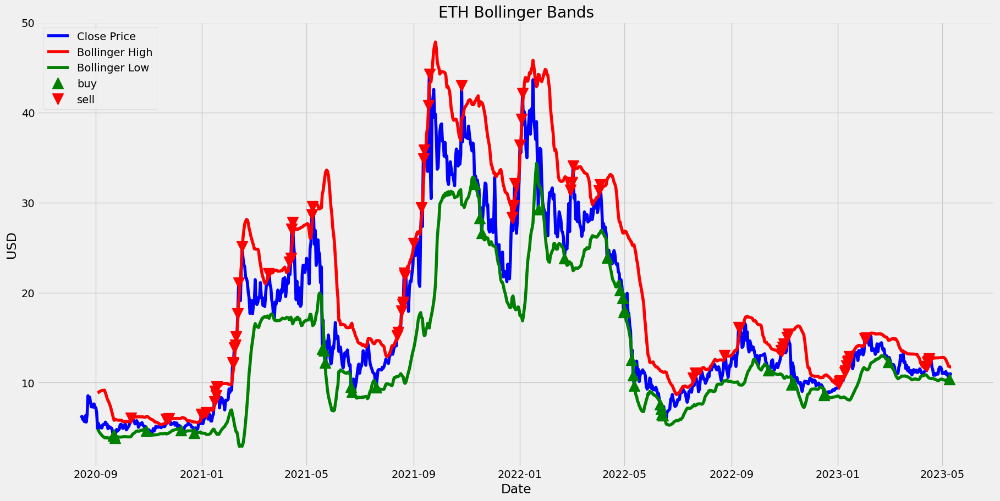

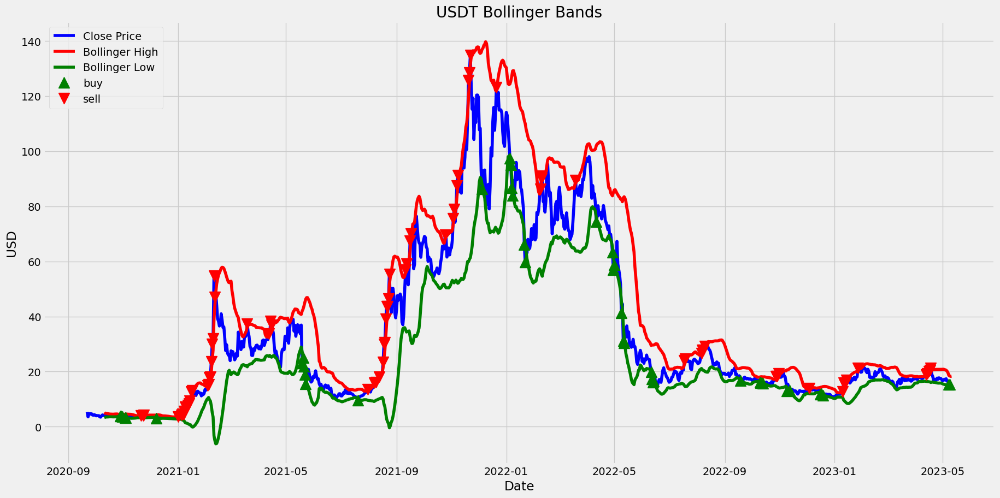

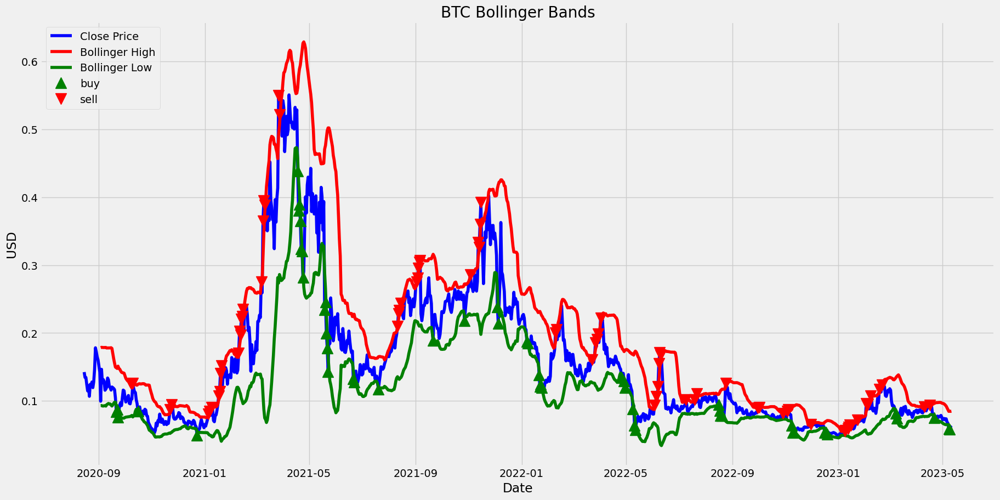

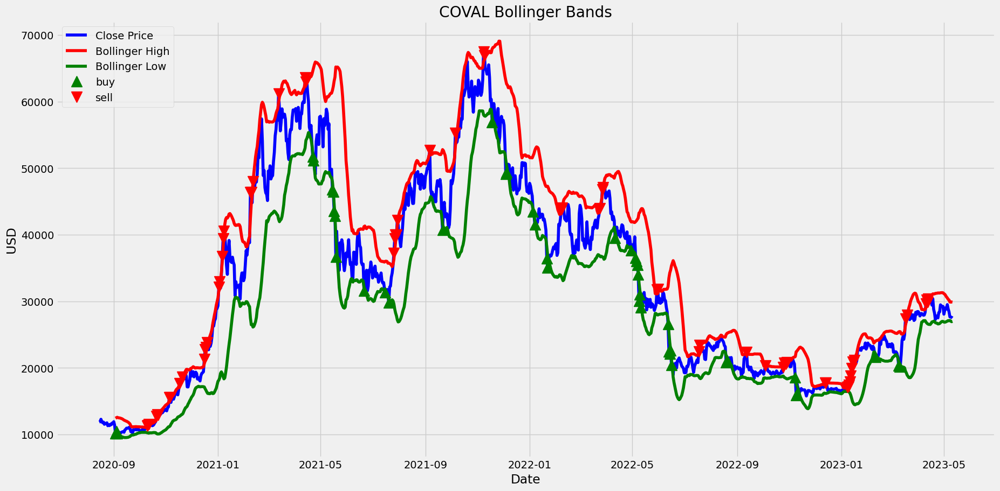

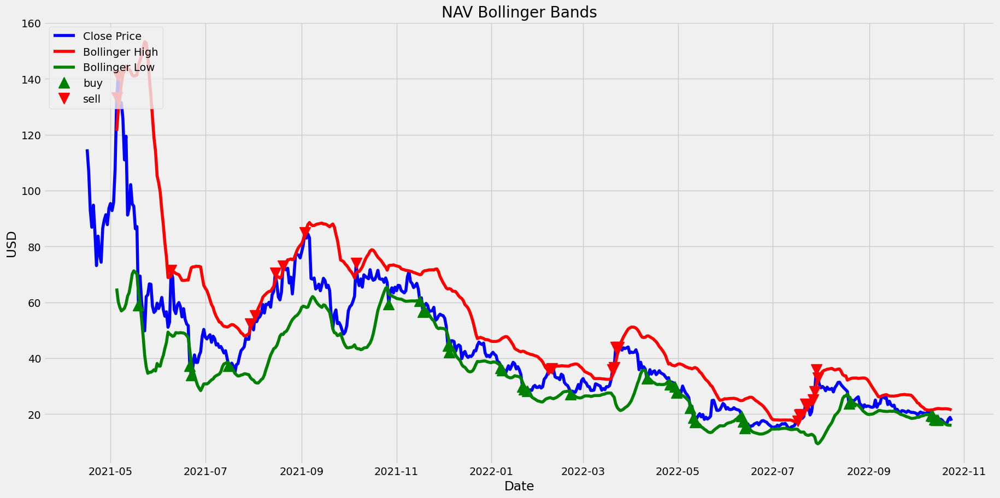

...

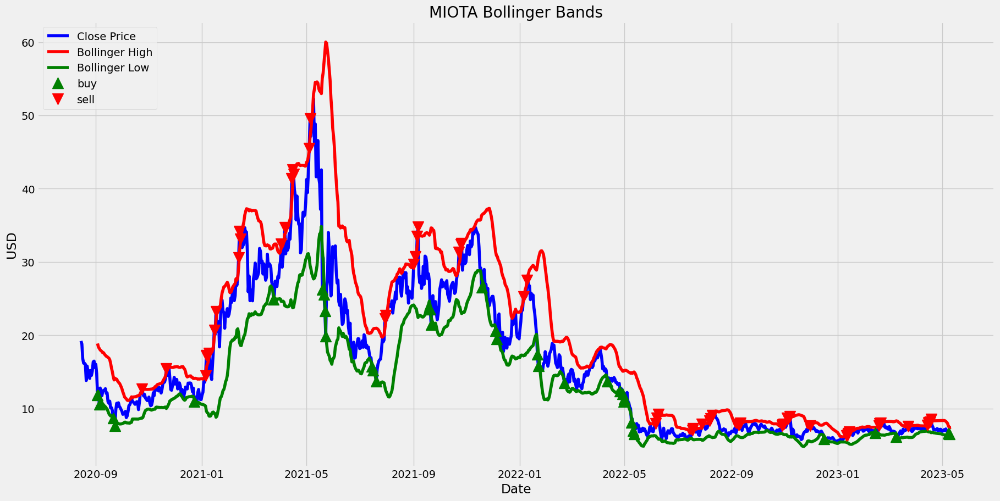

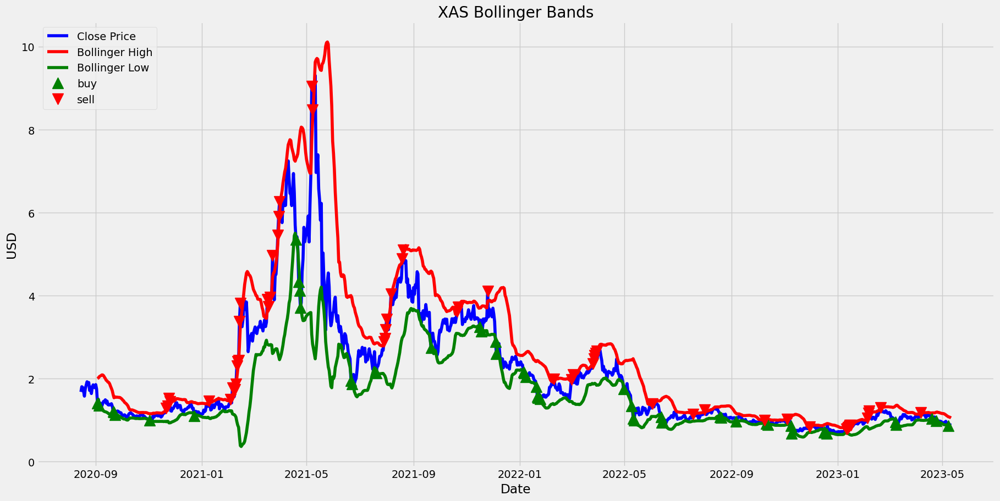

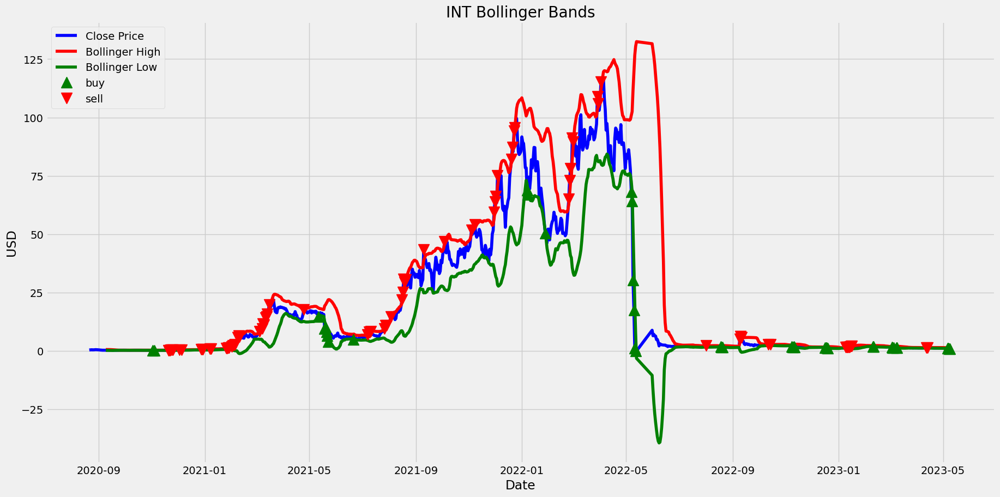

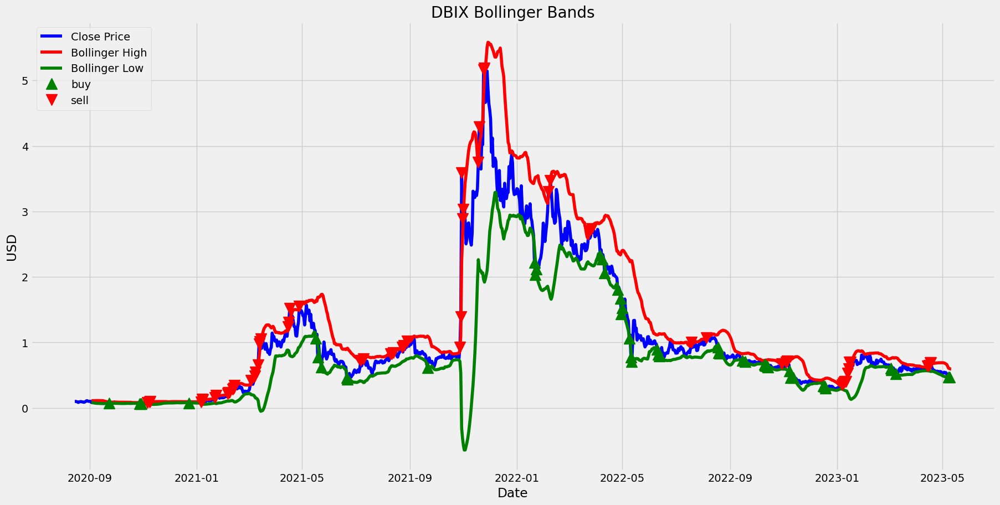

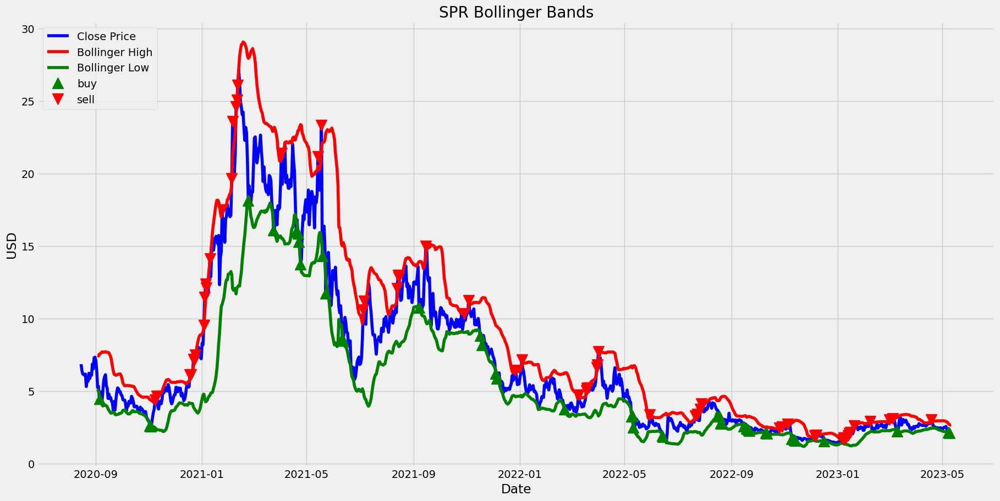

In [11]:
def plot_bollinger_bands(df, coin):
    plt.figure(figsize = (20, 10))
    plt.plot(df['close'], label = 'Close Price', color = 'blue')
    plt.plot(df['bollinger high'], label = 'Bollinger High', color = 'red')
    plt.plot(df['bollinger low'], label = 'Bollinger Low', color = 'green')
    #Add markers for buy and sell signals.
    plt.plot(df[df['bollinger signal'] == 'buy']['close'], marker = '^', markersize = 15, color = 'green', label = 'buy', linestyle = 'none')
    plt.plot(df[df['bollinger signal'] == 'sell']['close'], marker = 'v', markersize = 15, color = 'red', label = 'sell', linestyle = 'none')
    plt.title(f'{coin} Bollinger Bands')
    plt.xlabel('Date')
    plt.ylabel('USD')
    plt.legend(loc = 'upper left')
    plt.show()
        
    
for i in range(len(bollinger_dfs)):
    plot_bollinger_bands(bollinger_dfs[i], coins[i])



4. Calculating Volatility Indicators (e.g. Average True Range)

In [12]:
def atr(df, window_size):
    high_low = df['high'] - df['low']
    high_close = abs(df['high'] - df['close'].shift())
    low_close = abs(df['low'] - df['close'].shift())
    ranges = pd.concat([high_low, high_close, low_close], axis = 1)
    true_range = np.max(ranges, axis = 1)
    atr = true_range.rolling(window = window_size).mean()
    df['atr'] = atr
    return df

atr_dfs = []
for df in all_df:
    atr_dfs.append(atr(df, 20))
atr_dfs
    

[                  date    open    high     low   close  adj close     volume  \
 date                                                                           
 2020-08-15  2020-08-15   6.101   6.350   5.895   6.077      6.077  2639329.0   
 2020-08-16  2020-08-16   6.077   6.391   5.781   6.243      6.243  3149876.0   
 2020-08-17  2020-08-17   6.246   6.318   5.860   5.907      5.907  2725418.0   
 2020-08-18  2020-08-18   5.901   6.160   5.515   5.826      5.826  2805280.0   
 2020-08-19  2020-08-19   5.825   5.934   5.300   5.650      5.650  2780331.0   
 ...                ...     ...     ...     ...     ...        ...        ...   
 2023-05-07  2023-05-07  10.841  11.097  10.774  10.974     10.974   811361.0   
 2023-05-08  2023-05-08  10.970  11.144  10.393  10.591     10.591  2932929.0   
 2023-05-09  2023-05-09  10.590  10.716  10.148  10.375     10.375  1909951.0   
 2023-05-10  2023-05-10  10.375  11.200  10.200  10.983     10.983  3105538.0   
 2023-05-11  2023-05-11  10.

5. Calculating Momentum Indicators (Relative Strength Index) 

In [13]:
def rsi(df, window_size):
    delta = df['close'].diff()
    up = delta.clip(lower = 0)
    down = -1 * delta.clip(upper = 0)
    ema_up = up.ewm(com = window_size - 1, adjust = False).mean()
    ema_down = down.ewm(com = window_size - 1, adjust = False).mean()
    rs = ema_up / ema_down
    df['rsi'] = 100 - (100 / (1 + rs))
    return df

rsi_dfs = []
for df in all_df:
    rsi_dfs.append(rsi(df, 14))
rsi_dfs


[                  date    open    high     low   close  adj close     volume  \
 date                                                                           
 2020-08-15  2020-08-15   6.101   6.350   5.895   6.077      6.077  2639329.0   
 2020-08-16  2020-08-16   6.077   6.391   5.781   6.243      6.243  3149876.0   
 2020-08-17  2020-08-17   6.246   6.318   5.860   5.907      5.907  2725418.0   
 2020-08-18  2020-08-18   5.901   6.160   5.515   5.826      5.826  2805280.0   
 2020-08-19  2020-08-19   5.825   5.934   5.300   5.650      5.650  2780331.0   
 ...                ...     ...     ...     ...     ...        ...        ...   
 2023-05-07  2023-05-07  10.841  11.097  10.774  10.974     10.974   811361.0   
 2023-05-08  2023-05-08  10.970  11.144  10.393  10.591     10.591  2932929.0   
 2023-05-09  2023-05-09  10.590  10.716  10.148  10.375     10.375  1909951.0   
 2023-05-10  2023-05-10  10.375  11.200  10.200  10.983     10.983  3105538.0   
 2023-05-11  2023-05-11  10.

6. Calculating Volume Indicators (Chaikin Money Flow)

In [14]:
def chaikin_money_flow(df):
    mfm = ((df['close'] - df['low']) - (df['high'] - df['close'])) / (df['high'] - df['low'])
    mfv = mfm * df['volume']
    cmf = mfv.rolling(window = 20).sum() / df['volume'].rolling(window = 20).sum()
    df['cmf'] = cmf
    return df

cmf_dfs = []
for df in all_df:
    cmf_dfs.append(chaikin_money_flow(df))
cmf_dfs

[                  date    open    high     low   close  adj close     volume  \
 date                                                                           
 2020-08-15  2020-08-15   6.101   6.350   5.895   6.077      6.077  2639329.0   
 2020-08-16  2020-08-16   6.077   6.391   5.781   6.243      6.243  3149876.0   
 2020-08-17  2020-08-17   6.246   6.318   5.860   5.907      5.907  2725418.0   
 2020-08-18  2020-08-18   5.901   6.160   5.515   5.826      5.826  2805280.0   
 2020-08-19  2020-08-19   5.825   5.934   5.300   5.650      5.650  2780331.0   
 ...                ...     ...     ...     ...     ...        ...        ...   
 2023-05-07  2023-05-07  10.841  11.097  10.774  10.974     10.974   811361.0   
 2023-05-08  2023-05-08  10.970  11.144  10.393  10.591     10.591  2932929.0   
 2023-05-09  2023-05-09  10.590  10.716  10.148  10.375     10.375  1909951.0   
 2023-05-10  2023-05-10  10.375  11.200  10.200  10.983     10.983  3105538.0   
 2023-05-11  2023-05-11  10.

<u> <h5>7. Creating the Signals DataFrame </h5> </u>

In [15]:
#use 4 indicators to create a signal
#buy when all 4 indicators are buy(bollinger, atr, rsi, cmf)
#sell when all 4 indicators are sell
#hold when 2 or more indicators are hold

def create_strategy_4_indicators(df):
    signal = []
    
    
    for i in range(len(df)):
        if df['bollinger signal'][i] == 'buy' and df['rsi'][i] < 30:
            signal.append('buy')
        elif df['bollinger signal'][i] == 'sell' and df['rsi'][i] > 70:  
            signal.append('sell')
        else:
            signal.append('hold')
    df['signal'] = signal
    return df


strategy_4_indicators_dfs = []
for df in all_df:
    strategy_4_indicators_dfs.append(create_strategy_4_indicators(df))
    

    

<u> <h5>8. Plotting the Indicators </h5> </u>

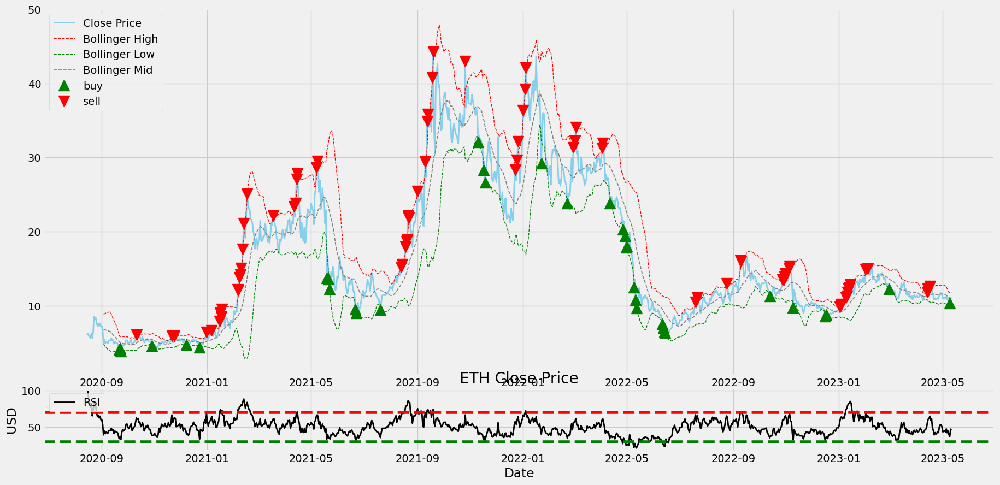

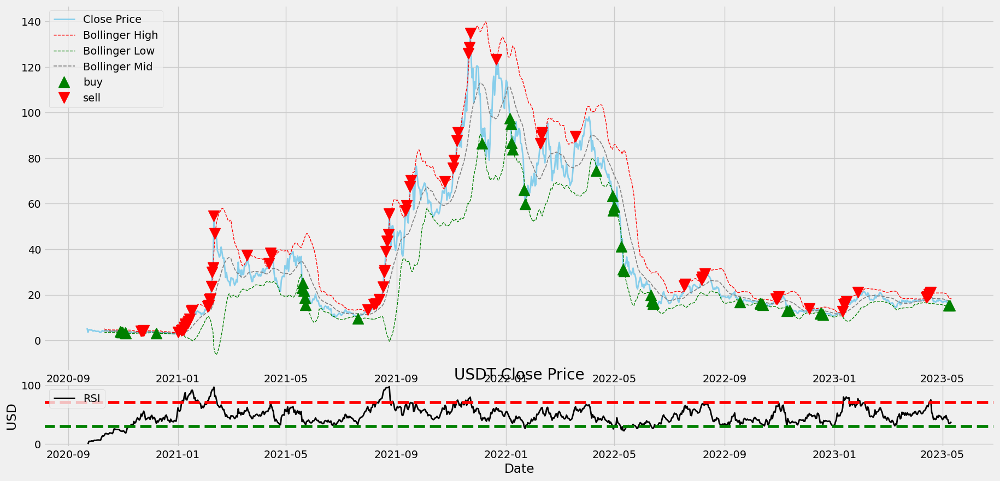

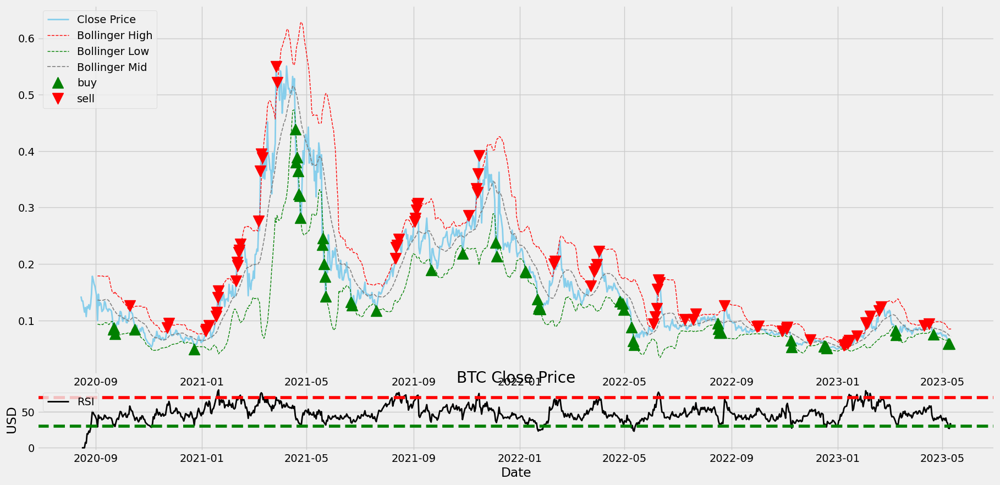

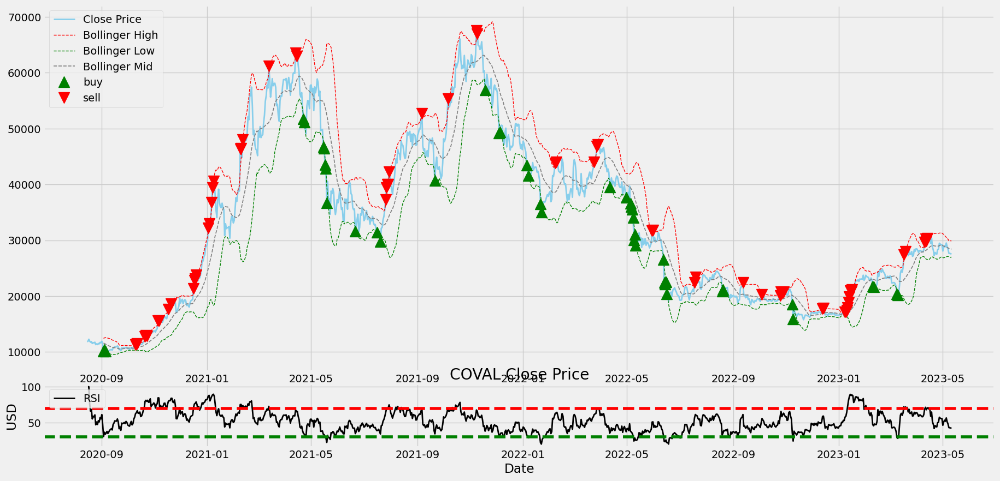

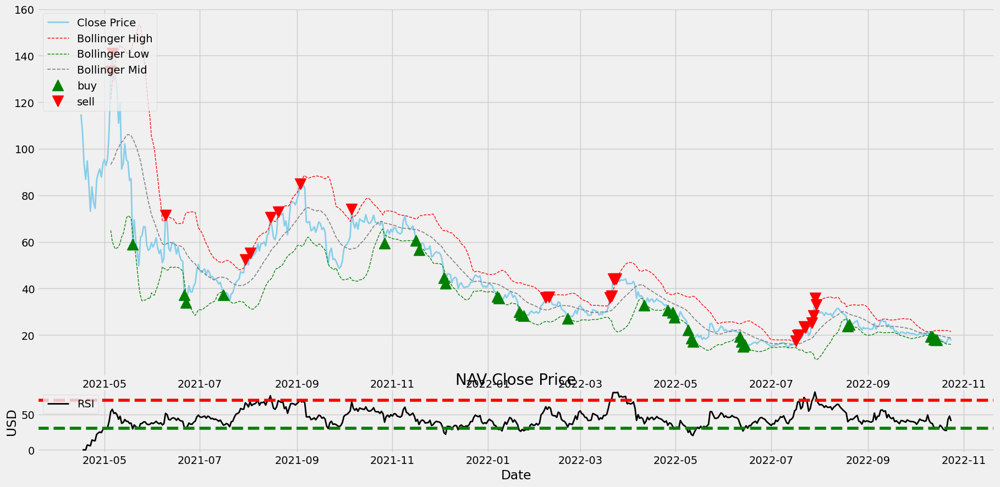

...

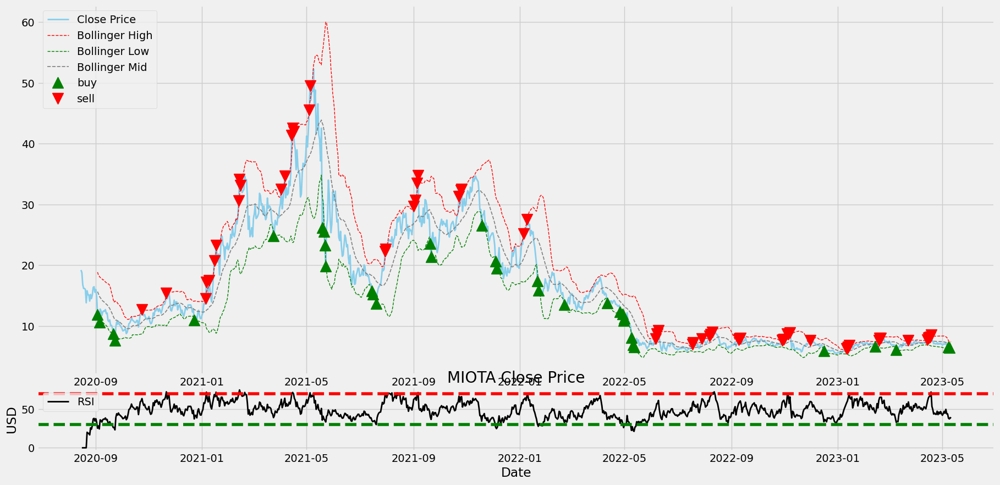

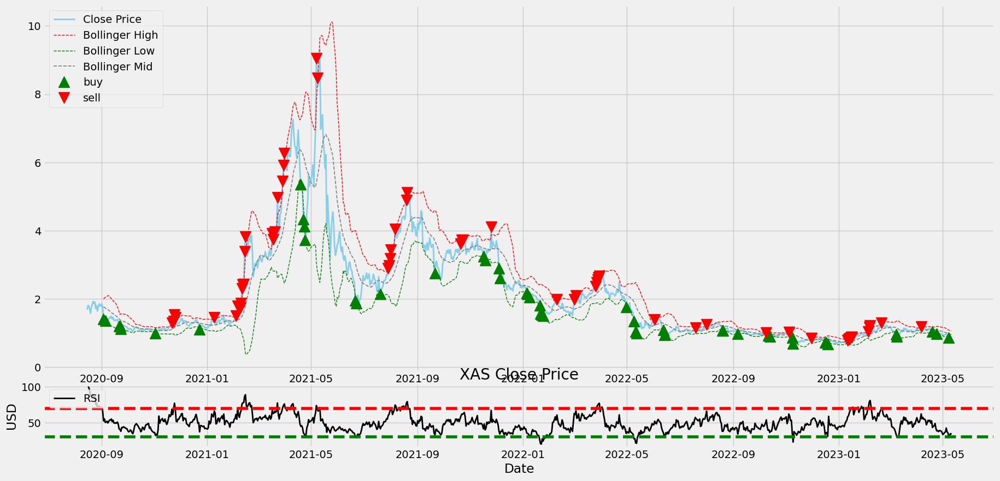

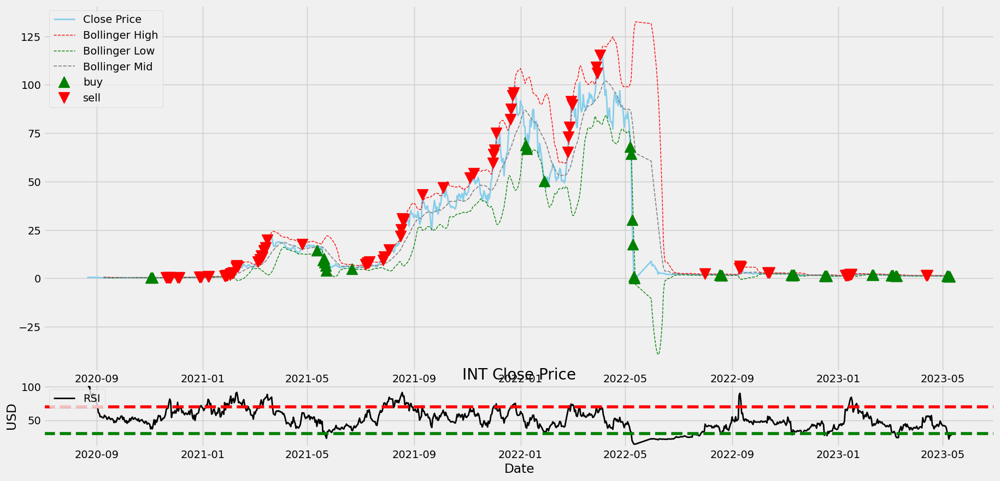

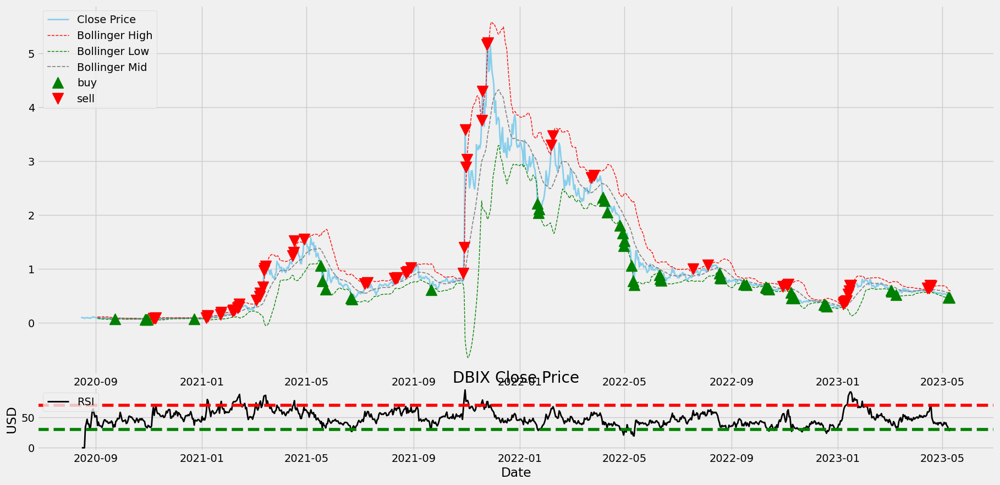

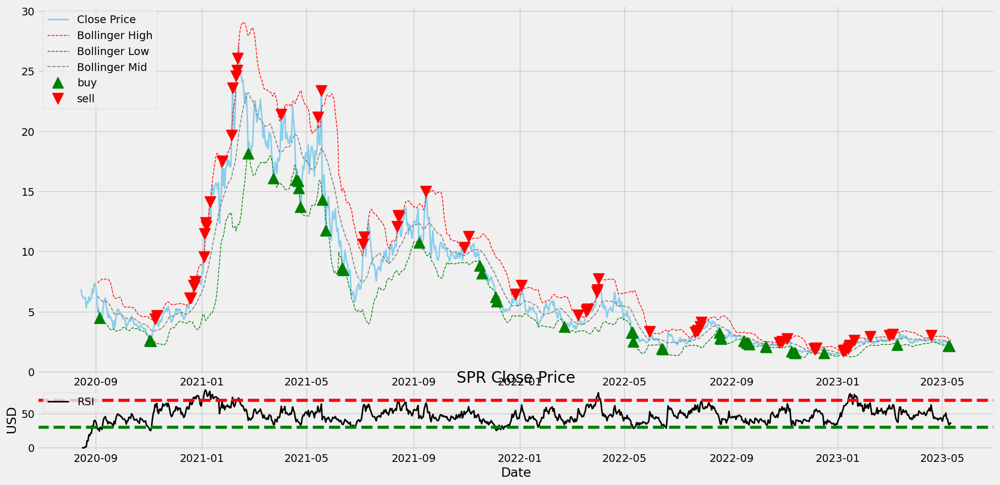

In [16]:
def plot_indicators_df(df, coin):
    ax1 = plt.subplot2grid((6, 1), (0, 0), rowspan = 5, colspan = 1)
    ax2 = plt.subplot2grid((6, 1), (5, 0), rowspan = 1, colspan = 1, sharex = ax1)
    ax1.plot(df['close'], label = 'Close Price', color = 'skyblue', linewidth = 2)
    plt.title(f'{coin} Close Price')
    plt.xlabel('Date')
    plt.ylabel('USD')
    ax1.plot(df['bollinger high'], label = 'Bollinger High', color = 'red', linewidth = 1, linestyle = '--')
    ax1.plot(df['bollinger low'], label = 'Bollinger Low', color = 'green', linewidth = 1 , linestyle = '--')
    ax1.plot(df['bollinger mid'], label = 'Bollinger Mid', color = 'grey', linewidth = 1.2, linestyle = '--')
    ax1.plot(df[df['bollinger signal'] == 'buy']['close'], marker = '^', markersize = 15, color = 'green', label = 'buy', linestyle = 'none')
    ax1.plot(df[df['bollinger signal'] == 'sell']['close'], marker = 'v', markersize = 15, color = 'red', label = 'sell', linestyle = 'none')
    ax1.legend(loc = 'upper left')
    ax2.plot(df['rsi'], label = 'RSI', color = 'black', linewidth = 2)
    ax2.axhline(30, color = 'green', linestyle = '--')
    ax2.axhline(70, color = 'red', linestyle = '--')
    ax2.legend(loc = 'upper left')
    
    plt.show()

    
  




for i in range(len(strategy_4_indicators_dfs)):
    plot_indicators_df(strategy_4_indicators_dfs[i], coins[i])

<u> <h5>9. Creating the Trading Strategy based on the Indicators </h5> </u>

In [17]:

#Strategy shouldn't repeat the same signal
#If the previous signal is buy, the next signal can't be buy
#If the previous signal is sell, the next signal can't be sell
#If the previous signal is hold, the next signal can be buy or sell

def my_strategy(df):
    position = []
    
    #It should be in order of buy, sell, hold
    for i in range(len(df)):
        if df['signal'][i] == 'buy' and df['signal'][i - 1] != 'buy':
            position.append(1)
        elif df['signal'][i] == 'sell' and df['signal'][i - 1] != 'sell':
            position.append(-1)
        elif df['signal'][i] == 'hold' and df['signal'][i - 1] == 'buy':
            position.append(1)
        elif df['signal'][i] == 'hold' and df['signal'][i - 1] == 'sell':
            position.append(-1)
        else:
            position.append(0)
        
    df['position'] = position
    return df


position_dfs = []
for df in strategy_4_indicators_dfs:
    position_dfs.append(my_strategy(df))
    
for i in range(len(position_dfs)):
    print(position_dfs[i]['position'].value_counts())

 0    964
-1     26
 1     10
Name: position, dtype: int64
 0    916
-1     30
 1     16
Name: position, dtype: int64
 0    958
-1     28
 1     14
Name: position, dtype: int64
 0    952
-1     34
 1     14
Name: position, dtype: int64
 0    529
 1     18
-1     10
Name: position, dtype: int64
 0    952
-1     34
 1     14
Name: position, dtype: int64
 0    954
-1     34
 1     12
Name: position, dtype: int64
 0    962
-1     20
 1     18
Name: position, dtype: int64
 0    960
-1     24
 1     16
Name: position, dtype: int64
 0    909
-1     50
 1     18
Name: position, dtype: int64
 0    952
-1     26
 1     22
Name: position, dtype: int64
 0    976
-1     16
 1      8
Name: position, dtype: int64


<u> <h5>10. Plotting the Trading Lists </h5> </u>

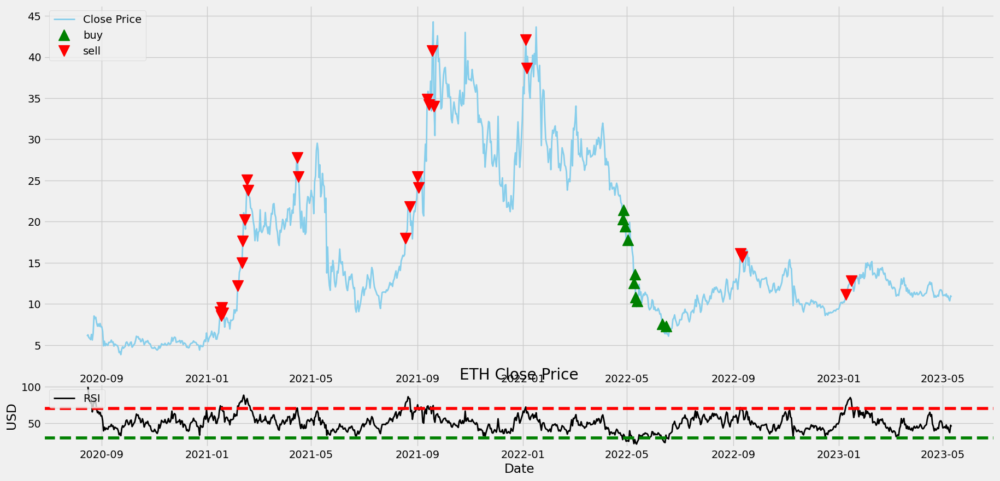

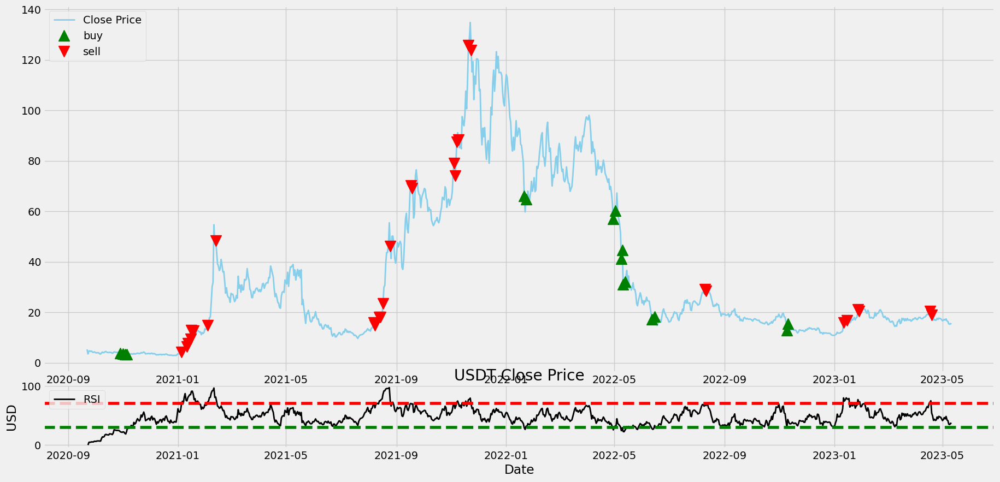

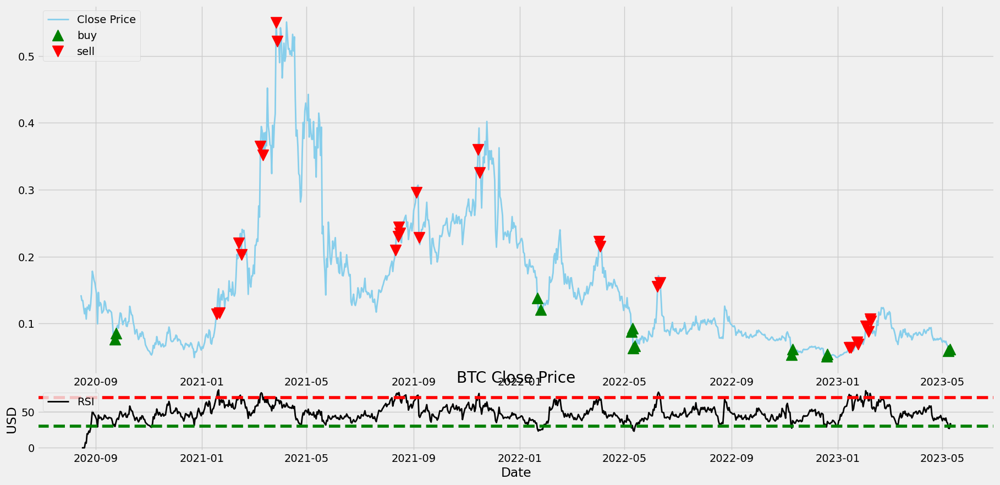

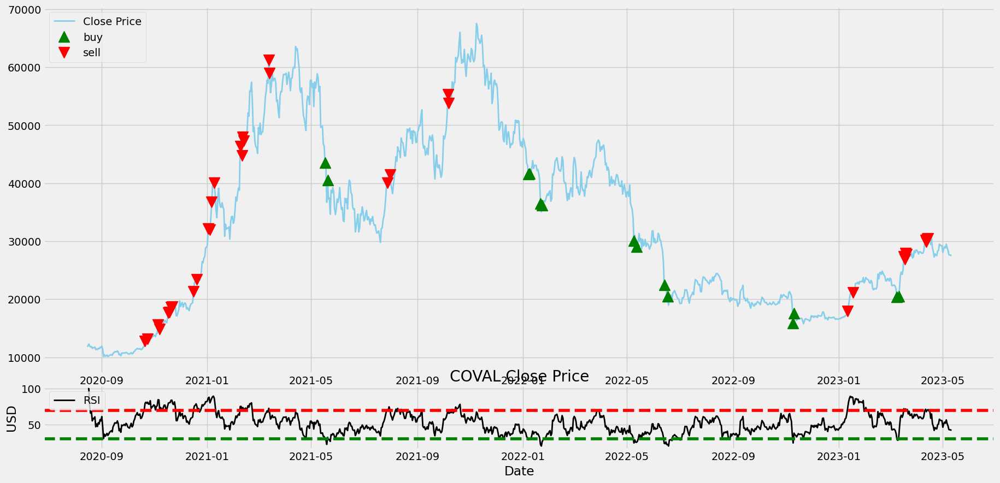

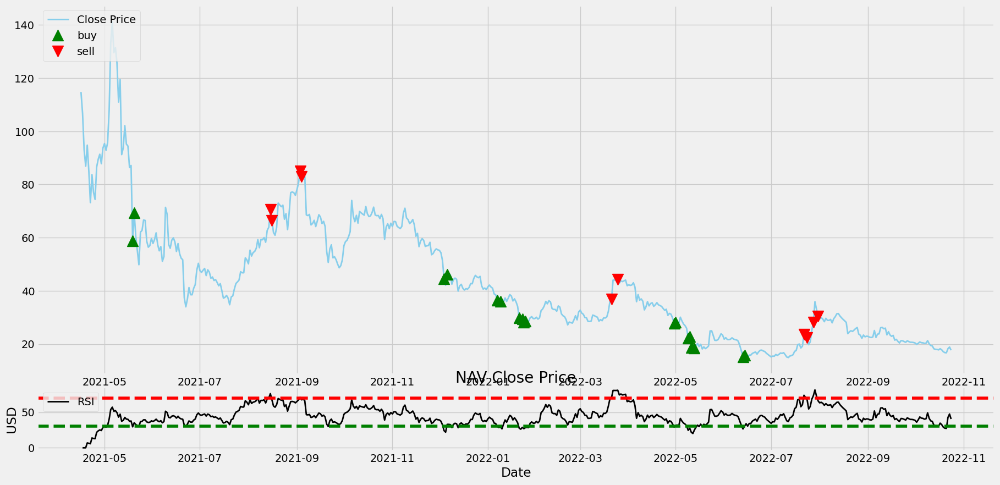

...

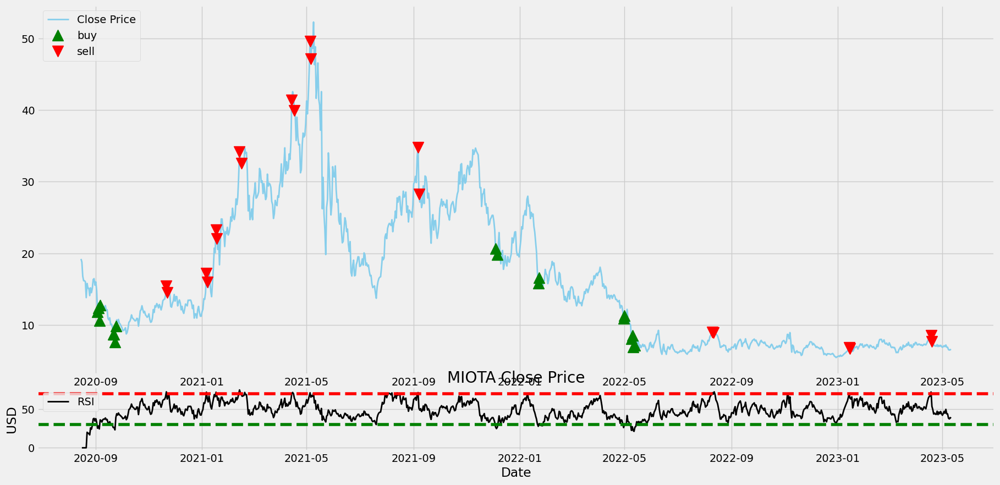

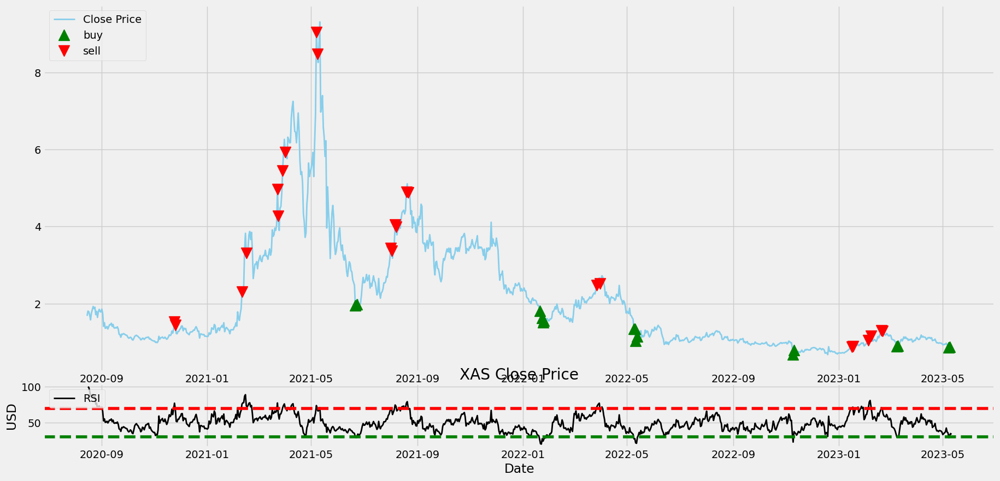

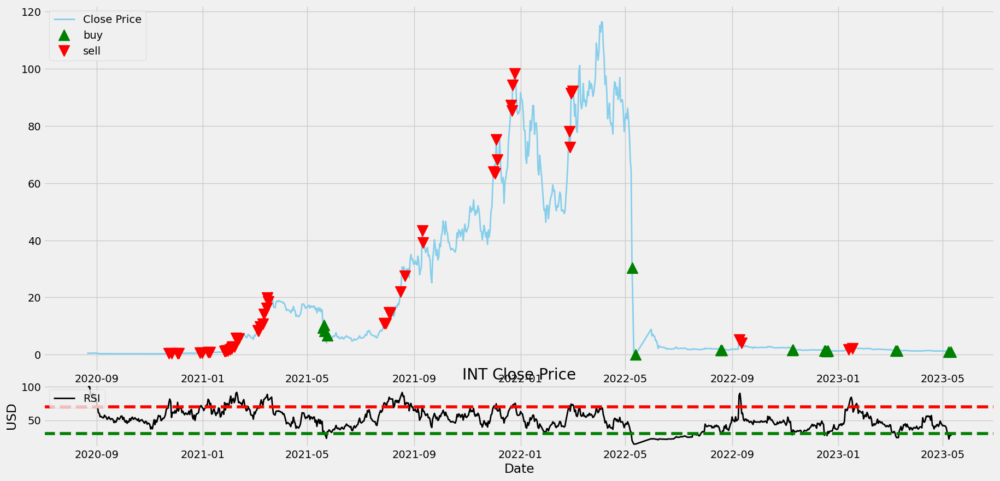

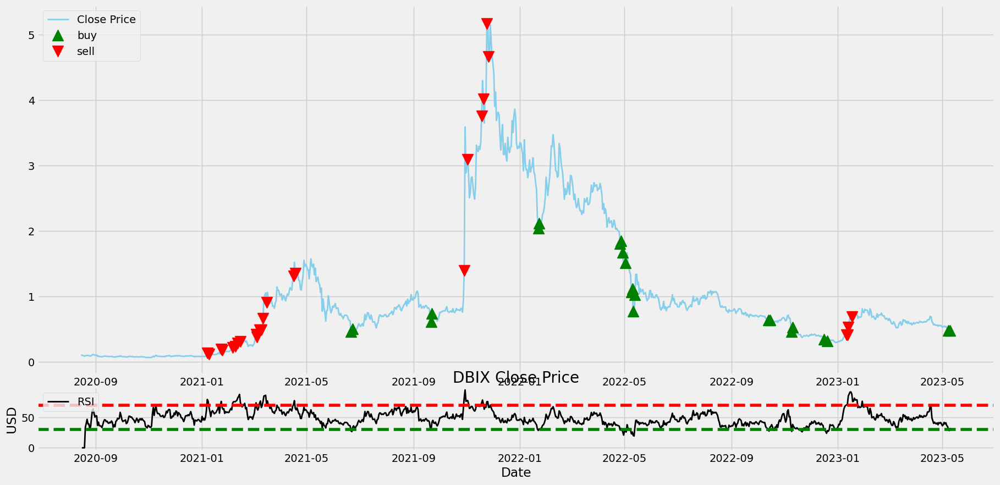

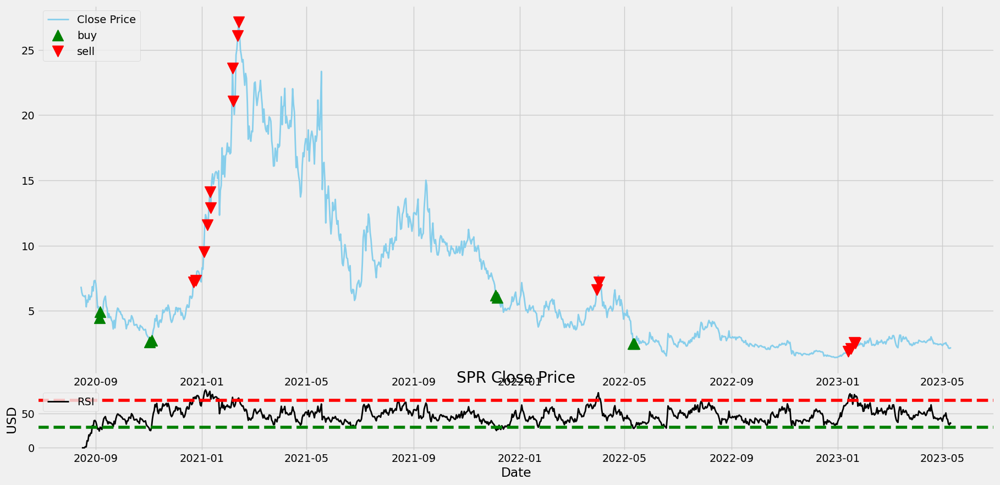

In [18]:
def plot_my_strategy(df, coin):
    ax1 = plt.subplot2grid((6, 1), (0, 0), rowspan = 5, colspan = 1)
    ax2 = plt.subplot2grid((6, 1), (5, 0), rowspan = 1, colspan = 1, sharex = ax1)
    ax1.plot(df['close'], label = 'Close Price', color = 'skyblue', linewidth = 2)
    plt.title(f'{coin} Close Price')
    plt.xlabel('Date')
    plt.ylabel('USD')
    ax1.plot(df[df['position'] == 1]['close'], marker = '^', markersize = 15, color = 'green', label = 'buy', linestyle = 'none')
    ax1.plot(df[df['position'] == -1]['close'], marker = 'v', markersize = 15, color = 'red', label = 'sell', linestyle = 'none')
    ax1.legend(loc = 'upper left')
    ax2.plot(df['rsi'], label = 'RSI', color = 'black', linewidth = 2)
    ax2.axhline(30, color = 'green', linestyle = '--')
    ax2.axhline(70, color = 'red', linestyle = '--')
    ax2.legend(loc = 'upper left')
    
    plt.show()
    
for i in range(len(position_dfs)):
    plot_my_strategy(position_dfs[i], coins[i])


Stop Loss from Price

In [19]:
def stop_loss(df):
    SLSignal = [0] * len(df)
    SLbackcandles = 3
    
    for i in range(SLbackcandles, len(df)):
        if df['position'][i] == 1:
            for j in range(0, SLbackcandles):
                if df['close'][i] < df['close'][i - j]:
                    SLSignal[i] = -1
                    break
        elif df['position'][i] == -1:
            for j in range(0, SLbackcandles):
                if df['close'][i] > df['close'][i - j]:
                    SLSignal[i] = 1
                    break
    df['SLSignal'] = SLSignal
    return df

stop_loss_dfs = []
for df in position_dfs:
    stop_loss_dfs.append(stop_loss(df))
        

<u> <h5> 11. Backtesting </h5> </u>

In [20]:
def backtesting(df, coin):
    df_ret = pd.DataFrame(np.diff(df['close'])).rename(columns = {0:'returns'})
    strat_ret = []
    
    for i in range(len(df_ret)):
        try:
            returns = df_ret['returns'][i + 1] * df['position'][i]
            strat_ret.append(returns)
        except:
            pass
        
    strat_ret_df = pd.DataFrame(strat_ret).rename(columns = {0:'returns'})
    
    investment_value = 100000
    trading_cost = 0.001
    number_coins = investment_value / df['close'][0]
    strat_investment_ret = []
    
    for i in range(len(strat_ret_df)):
        returns = number_coins * strat_ret_df['returns'][i]
        strat_investment_ret.append(returns)
        

    strat_investment_ret_df = pd.DataFrame(strat_investment_ret).rename(columns = {0:'returns'})
    total_investment_ret = round(sum(strat_investment_ret_df['returns']), 2)
    profit_percentage = float((total_investment_ret / investment_value) * 100)   
    print(f'Initial Investment: {investment_value}')
    print(f'For a time period of {len(df)} days')
    print(f'Total Investment Return for {coin}: {total_investment_ret}')
    print(f'Strategy Investment Return for {coin}: {total_investment_ret}%')
    print(f'Profit Percentage for {coin}: {profit_percentage}%')
    print('-----------------------------------------------')
    return strat_investment_ret_df

backtesting_dfs = []
for i in range(len(stop_loss_dfs)):
    backtesting_dfs.append(backtesting(stop_loss_dfs[i], coins[i]))


        

Initial Investment: 100000
For a time period of 1000 days
Total Investment Return for ETH: -45285.5
Strategy Investment Return for ETH: -45285.5%
Profit Percentage for ETH: -45.2855%
-----------------------------------------------
Initial Investment: 100000
For a time period of 962 days
Total Investment Return for USDT: -252008.72
Strategy Investment Return for USDT: -252008.72%
Profit Percentage for USDT: -252.00871999999998%
-----------------------------------------------
Initial Investment: 100000
For a time period of 1000 days
Total Investment Return for BTC: 114150.28
Strategy Investment Return for BTC: 114150.28%
Profit Percentage for BTC: 114.15028000000001%
-----------------------------------------------
Initial Investment: 100000
For a time period of 1000 days
Total Investment Return for COVAL: -40743.48
Strategy Investment Return for COVAL: -40743.48%
Profit Percentage for COVAL: -40.743480000000005%
-----------------------------------------------
Initial Investment: 100000
F

<u> <h5> 12. SPY ETF Comparison </h5> </u>

In [21]:
#The SPDR S&P 500 ETF Trust offers investors an efficient way to diversify
#their exposure to the U.S. equity market without having to invest in multiple stocks. 

def get_benchmark(start_date, investment_value):
    spy = get_historical_data('SPY', start_date)['close']
    benchmark = pd.DataFrame(np.diff(spy)).rename(columns = {0:'benchmark_returns'})
    
    investment_value = investment_value
    number_of_stocks = floor(investment_value/spy[0])
    benchmark_investment_ret = []
    
    for i in range(len(benchmark['benchmark_returns'])):
        returns = number_of_stocks*benchmark['benchmark_returns'][i]
        benchmark_investment_ret.append(returns)

    benchmark_investment_ret_df = pd.DataFrame(benchmark_investment_ret).rename(columns = {0:'investment_returns'})
    return benchmark_investment_ret_df
   
   
benchmark = get_benchmark('2020-01-01', 100000)

investment_value = 100000
total_benchmark_investment_ret = round(sum(benchmark['investment_returns']), 2)
benchmark_profit_percentage = floor((total_benchmark_investment_ret/investment_value)*100)
print(f'Initial Investment: {investment_value}')
print(f'For a time period of {len(benchmark)} days')
print(f'Total Investment Return for SPY: {total_benchmark_investment_ret}')
print(f'Strategy Investment Return for SPY: {total_benchmark_investment_ret}%')
print(f'Profit Percentage for SPY: {benchmark_profit_percentage}%')
print('-----------------------------------------------')


Initial Investment: 100000
For a time period of 845 days
Total Investment Return for SPY: 26788.82
Strategy Investment Return for SPY: 26788.82%
Profit Percentage for SPY: 26%
-----------------------------------------------


In [22]:
#Create a table to compare the returns of the strategy vs the benchmark
from prettytable import PrettyTable

my_table = PrettyTable(['Coin', 'Strategy Investment Return', 'Time Period'])
my_table.add_row(['ETH',  backtesting_dfs[0]['returns'].sum(), len(backtesting_dfs[0])])
my_table.add_row(['USDT',  backtesting_dfs[1]['returns'].sum(), len(backtesting_dfs[1])])
my_table.add_row(['BTC',  backtesting_dfs[2]['returns'].sum(), len(backtesting_dfs[2])])
my_table.add_row(['COVAL',  backtesting_dfs[3]['returns'].sum(), len(backtesting_dfs[3])])
my_table.add_row(['NAV', backtesting_dfs[4]['returns'].sum(), len(backtesting_dfs[4])])
my_table.add_row(['HUSH', backtesting_dfs[5]['returns'].sum(), len(backtesting_dfs[5])])
my_table.add_row(['XEM', backtesting_dfs[6]['returns'].sum(), len(backtesting_dfs[6])])
my_table.add_row(['MIOTA', backtesting_dfs[7]['returns'].sum(), len(backtesting_dfs[7])])
my_table.add_row(['XAS', backtesting_dfs[8]['returns'].sum(), len(backtesting_dfs[8])])
my_table.add_row(['INT', backtesting_dfs[9]['returns'].sum(), len(backtesting_dfs[9])])
my_table.add_row(['DBIX', backtesting_dfs[10]['returns'].sum(), len(backtesting_dfs[10])])
my_table.add_row(['SPR', backtesting_dfs[11]['returns'].sum(), len(backtesting_dfs[11])])

my_table.add_row(['SPY',  benchmark['investment_returns'].sum(), len(benchmark)])

print(my_table)
print(f"Backtesting Period: {len(backtesting_dfs[0])} days")

+-------+----------------------------+-------------+
|  Coin | Strategy Investment Return | Time Period |
+-------+----------------------------+-------------+
|  ETH  |     -45285.50271515548     |     998     |
|  USDT |    -252008.72295226806     |     960     |
|  BTC  |     114150.28089887639     |     998     |
| COVAL |     -40743.47811413718     |     998     |
|  NAV  |     -5268.155840535261     |     555     |
|  HUSH |     -357089.6558105108     |     998     |
|  XEM  |    -220720.72072072074     |     998     |
| MIOTA |     9439.113815430257      |     998     |
|  XAS  |    -24678.877259752586     |     998     |
|  INT  |     -9717686.601761712     |     975     |
|  DBIX |     631351.1326860841      |     998     |
|  SPR  |    -47076.833357632255     |     998     |
|  SPY  |          26788.82          |     845     |
+-------+----------------------------+-------------+
Backtesting Period: 998 days


<h2> MACD Strategy </h2>

<small>

* MACD LINE = FAST LENGTH EMA - SLOW LENGTH EMA
* HISTOGRAM = MACD LINE - SIGNAL LINE


* IF MACD LINE > SIGNAL LINE => BUY THE CRYPTO

  IF SIGNAL LINE > MACD LINE => SELL THE CRYPTO

<small/>

1. Load the data

In [23]:
path = 'crypto_data/'

atomusd = pd.read_csv(path + 'ATOMUSD.csv') 
avaxusd = pd.read_csv(path + 'AVAXUSD.csv')
blzusd = pd.read_csv(path + 'BLZUSD.csv')
btcusd = pd.read_csv(path + 'BTCUSD.csv')
btgusd = pd.read_csv(path + 'BTGUSD.csv')
ethusd = pd.read_csv(path + 'ETHUSD.csv')
gtousd = pd.read_csv(path + 'GTOUSD.csv')
linkusd = pd.read_csv(path + 'LINKUSD.csv')
lskusd = pd.read_csv(path + 'LSKUSD.csv')
lunausd = pd.read_csv(path + 'LUNAUSD.csv')
manausd = pd.read_csv(path + 'MANAUSD.csv')
snxusd = pd.read_csv(path + 'SNXUSD.csv')


all_df = [atomusd, avaxusd, blzusd, btcusd, btgusd, ethusd, gtousd, linkusd, lskusd, lunausd, manausd, snxusd]
all_df_names = ['ATOM', 'AVAX', 'BLZ', 'BTC', 'BTG', 'ETH', 'GTO', 'LINK', 'LSK', 'LUNA', 'MANA', 'SNX']


2. MACD Calculation

In [24]:

def get_macd(price, slow, fast, smooth):
    exp1 = price.ewm(span = fast, adjust = False).mean()
    exp2 = price.ewm(span = slow, adjust = False).mean()
    macd = pd.DataFrame(exp1 - exp2).rename(columns = {'close':'macd'})
    signal = pd.DataFrame(macd.ewm(span = smooth, adjust = False).mean()).rename(columns = {'macd':'signal'})
    hist = pd.DataFrame(macd['macd'] - signal['signal']).rename(columns = {0:'hist'})
    frames =  [macd, signal, hist]
    df = pd.concat(frames, join = 'inner', axis = 1)
    return df

#get macd for all coins with their names
macd_df = []
for i in range(len(all_df)):
    macd_df.append(get_macd(all_df[i]['close'], 26, 12, 9))
    macd_df[i].rename(columns = {'close':all_df_names[i]}, inplace = True)
        

    

#define a function named ‘get_macd’ that takes the stock’s price (‘prices’),
#length of the slow EMA (‘slow’), length of the fast EMA (‘fast’),
#and the period of the Signal line (‘smooth’).

In [25]:
#Check their shapes
for i in range(len(macd_df)):
    print(macd_df[i].shape)

(1000, 3)
(962, 3)
(1000, 3)
(1000, 3)
(557, 3)
(1000, 3)
(1000, 3)
(1000, 3)
(1000, 3)
(977, 3)
(1000, 3)
(1000, 3)


In [26]:
#Concatenate all the macd dataframes with the original dataframes
for i in range(len(all_df)):
    all_df[i] = pd.concat([all_df[i], macd_df[i]], join = 'inner', axis = 1)
    


In [27]:
#Check columns names
for i in range(len(all_df)):
    print(all_df[i].columns)
    

Index(['Unnamed: 0', 'open', 'high', 'low', 'close', 'adj close', 'volume',
       'macd', 'signal', 'hist'],
      dtype='object')
Index(['Unnamed: 0', 'open', 'high', 'low', 'close', 'adj close', 'volume',
       'macd', 'signal', 'hist'],
      dtype='object')
Index(['Unnamed: 0', 'open', 'high', 'low', 'close', 'adj close', 'volume',
       'macd', 'signal', 'hist'],
      dtype='object')
Index(['Unnamed: 0', 'open', 'high', 'low', 'close', 'adj close', 'volume',
       'macd', 'signal', 'hist'],
      dtype='object')
Index(['Unnamed: 0', 'open', 'high', 'low', 'close', 'adj close', 'volume',
       'macd', 'signal', 'hist'],
      dtype='object')
Index(['Unnamed: 0', 'open', 'high', 'low', 'close', 'adj close', 'volume',
       'macd', 'signal', 'hist'],
      dtype='object')
Index(['Unnamed: 0', 'open', 'high', 'low', 'close', 'adj close', 'volume',
       'macd', 'signal', 'hist'],
      dtype='object')
Index(['Unnamed: 0', 'open', 'high', 'low', 'close', 'adj close', 'volume',


In [28]:
#Rename the all columns' names  
for i in range(len(all_df)):
    all_df[i].columns = ['date', 'open', 'high', 'low',  'close', 'adj close', 'volume', 'macd', 'signal', 'hist']

#Date as index
for i in range(len(all_df)):
    all_df[i].set_index('date', inplace = True)
    

#Check the shape of the dataframes
for i in range(len(all_df)):
    print(all_df[i].shape)

(1000, 9)
(962, 9)
(1000, 9)
(1000, 9)
(557, 9)
(1000, 9)
(1000, 9)
(1000, 9)
(1000, 9)
(977, 9)
(1000, 9)
(1000, 9)


In [29]:
for i in range(len(all_df)):
    print(all_df[i].head())

             open   high    low  close  adj close     volume      macd  \
date                                                                     
2020-08-15  6.101  6.350  5.895  6.077      6.077  2639329.0  0.000000   
2020-08-16  6.077  6.391  5.781  6.243      6.243  3149876.0  0.013242   
2020-08-17  6.246  6.318  5.860  5.907      5.907  2725418.0 -0.003337   
2020-08-18  5.901  6.160  5.515  5.826      5.826  2805280.0 -0.022750   
2020-08-19  5.825  5.934  5.300  5.650      5.650  2780331.0 -0.051741   

              signal      hist  
date                            
2020-08-15  0.000000  0.000000  
2020-08-16  0.002648  0.010594  
2020-08-17  0.001451 -0.004789  
2020-08-18 -0.003389 -0.019361  
2020-08-19 -0.013059 -0.038681  
              open    high     low   close  adj close      volume      macd  \
date                                                                          
2020-09-22  0.8500  7.0000  0.8500  5.3193     5.3193  31441883.0  0.000000   
2020-09-23  5

In [30]:
#Change all index to datetime
for i in range(len(all_df)):
    all_df[i].index = pd.to_datetime(all_df[i].index)
    

3. MACD Plot

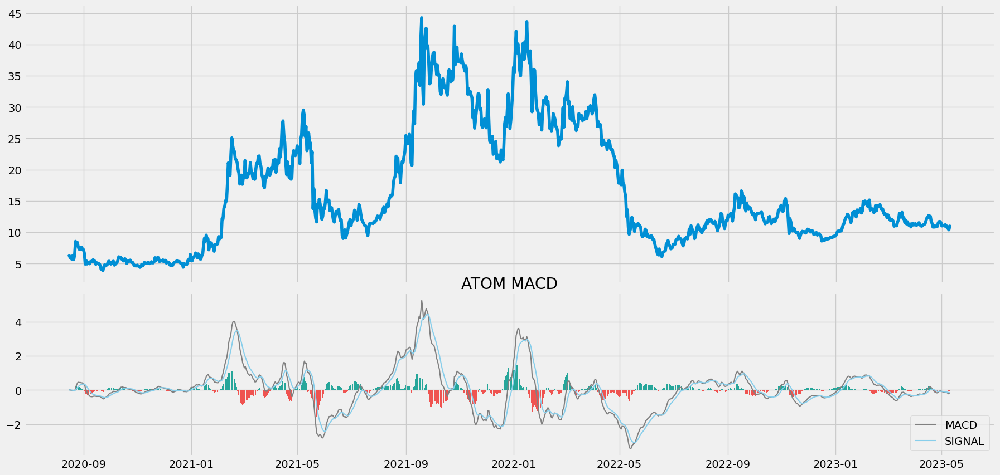

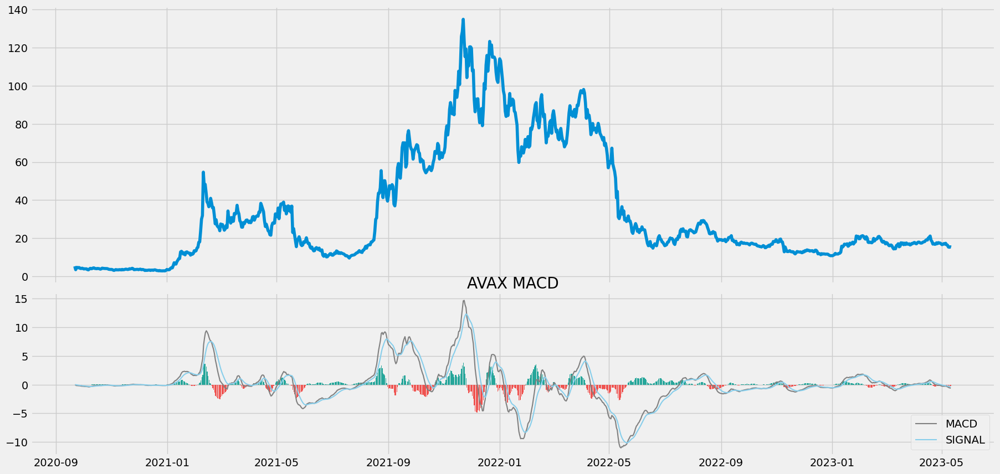

In [31]:
#leading indicators are plotted below the crypto’s price seperately.

def plot_macd(coin, prices, macd, signal, hist):
    ax1 = plt.subplot2grid((8,1), (0,0), rowspan = 5, colspan = 1)
    ax2 = plt.subplot2grid((8,1), (5,0), rowspan = 3, colspan = 1)

    #Show index as axis labels with interval (every 15 days)
  
    
    #hide the x axis label for the first graph
    plt.setp(ax1.get_xticklabels(), visible = False)
    
    
    ax1.plot(prices)
    ax2.plot(macd, color = 'grey', linewidth = 1.5, label = 'MACD')
    ax2.plot(signal, color = 'skyblue', linewidth = 1.5, label = 'SIGNAL')

    for i in range(len(prices)):
        if str(hist[i])[0] == '-':
            ax2.bar(prices.index[i], hist[i], color = '#ef5350')
        else:
            ax2.bar(prices.index[i], hist[i], color = '#26a69a')
    plt.title(f"{coin} MACD")
    plt.legend(loc = 'lower right')
    
    plt.show()
    
#plot macd for first 2 coins to check and add their names
for i in range(2):
    plot_macd(all_df_names[i], all_df[i]['close'], all_df[i]['macd'], all_df[i]['signal'], all_df[i]['hist'])

* Plot turns red whenever the market shows a negative trend and turns green whenever the market reveals a positive trend.

* The Histogram plot spreads larger whenever the difference between the MACD line and the Signal line is huge and it is noticeable that the Histogram plot shrinks at times representing the difference between the two of the other components is comparatively smaller.

* Slow length EMAs are used to identify the long-term trend of the market and the fast length EMAs are used to identify the short-term trend of the market.
Slow length EMA is 26 and fast length EMA is 12, signal length is 9.

* Grey line is the MACD line, blue line is the signal line, and the red and green bars are the histogram.

* The Signal line seems to be more of a smooth-cut version of the MACD line because it is calculated by averaging out the values of the MACD line itself.

4. Creating the Trading Strategy 

In [32]:
def implement_macd_strategy(prices, data):    
    buy_price = []
    sell_price = []
    macd_signal = []
    signal = 0

    for i in range(len(data)):
        if data['macd'][i] > data['signal'][i]:
            if signal != 1:
                buy_price.append(prices[i])
                sell_price.append(np.nan)
                signal = 1
                macd_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                macd_signal.append(0)
        elif data['macd'][i] < data['signal'][i]:
            if signal != -1:
                buy_price.append(np.nan)
                sell_price.append(prices[i])
                signal = -1
                macd_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                macd_signal.append(0)
        else:
            buy_price.append(np.nan)
            sell_price.append(np.nan)
            macd_signal.append(0)
            
    return buy_price, sell_price, macd_signal

#implement macd strategy for all coins
macd_signals = []
for i in range(len(all_df)):
    macd_signals.append(implement_macd_strategy(all_df[i]['close'], all_df[i]))
    all_df[i]['macd_signal'] = macd_signals[i][2]
    all_df[i]['macd_buy_price'] = macd_signals[i][0]
    all_df[i]['macd_sell_price'] = macd_signals[i][1]
    


5. Plotting the Trading Lists

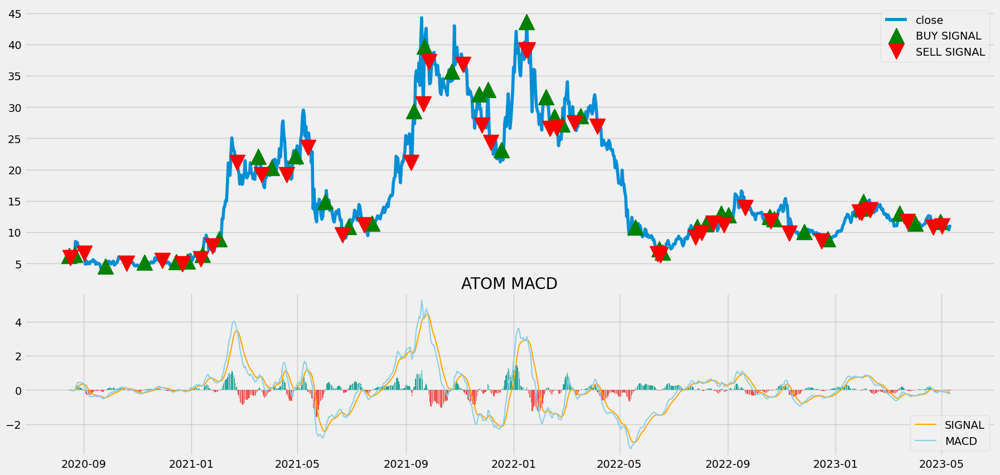

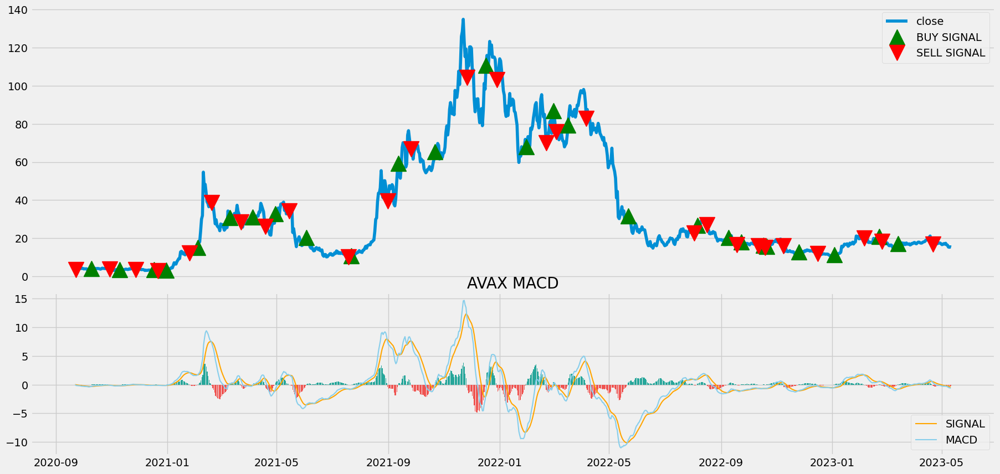

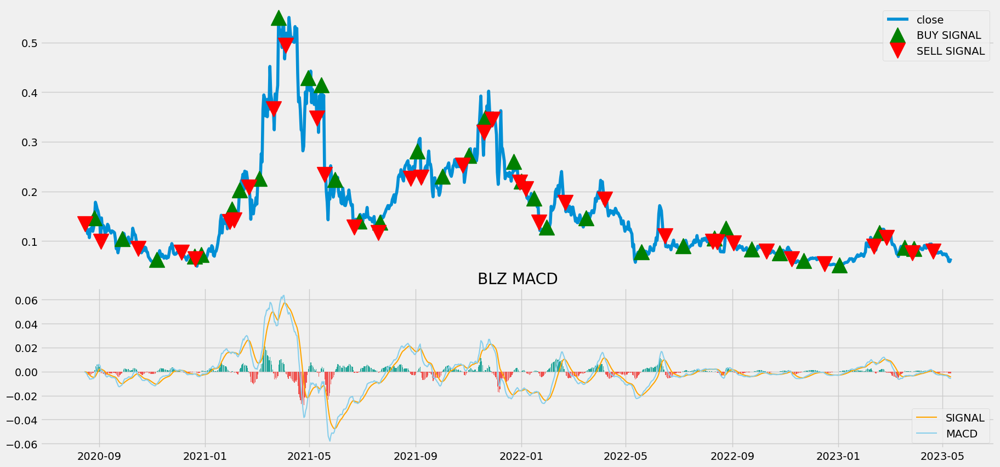

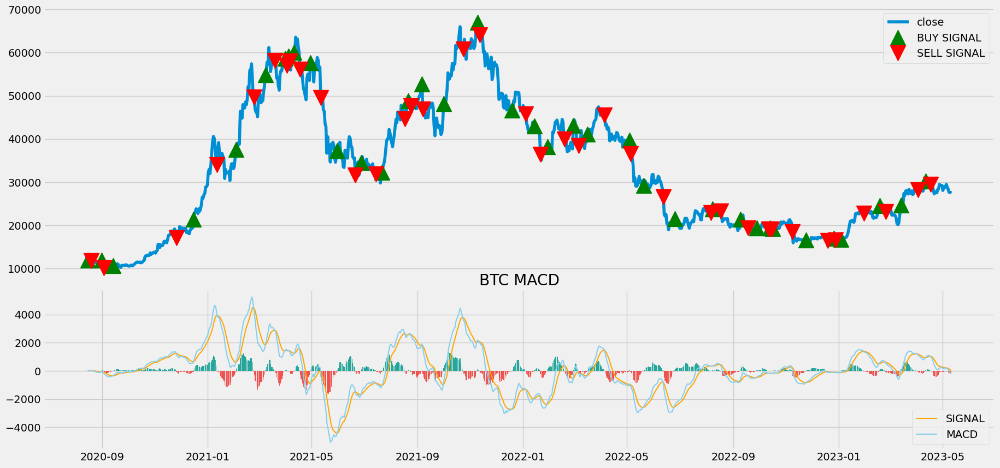

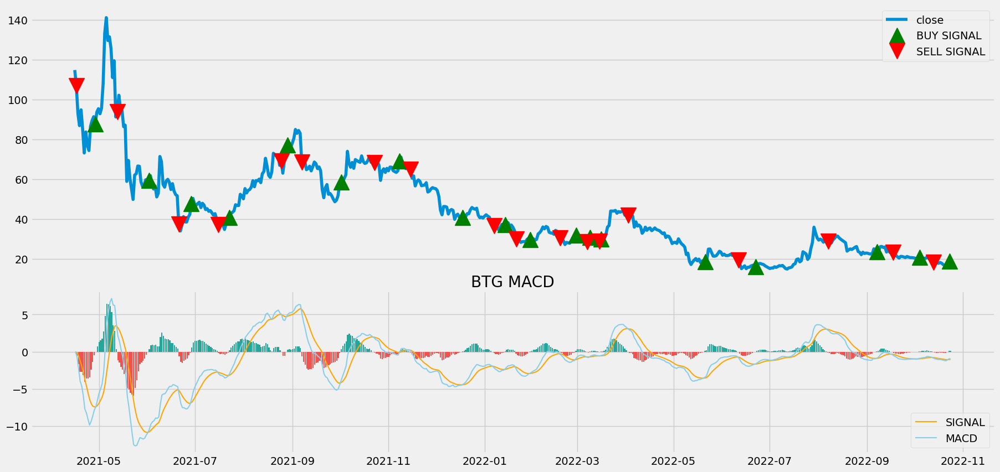

...

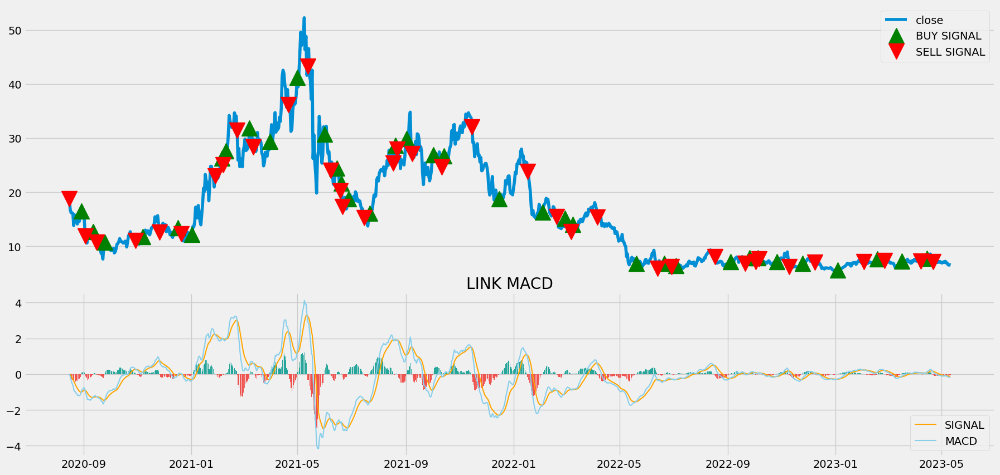

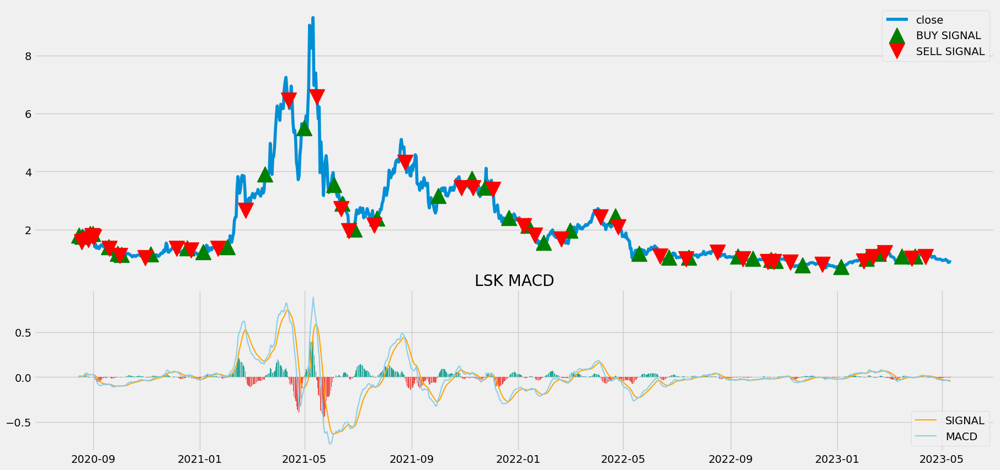

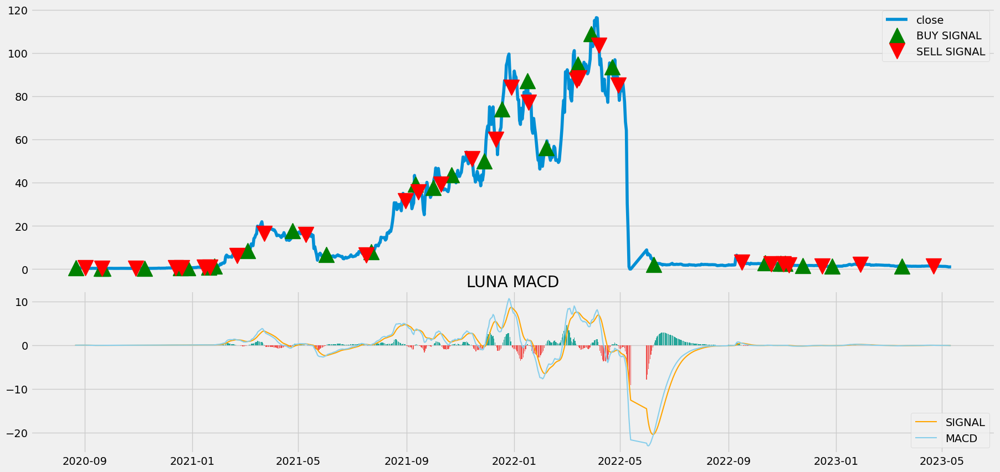

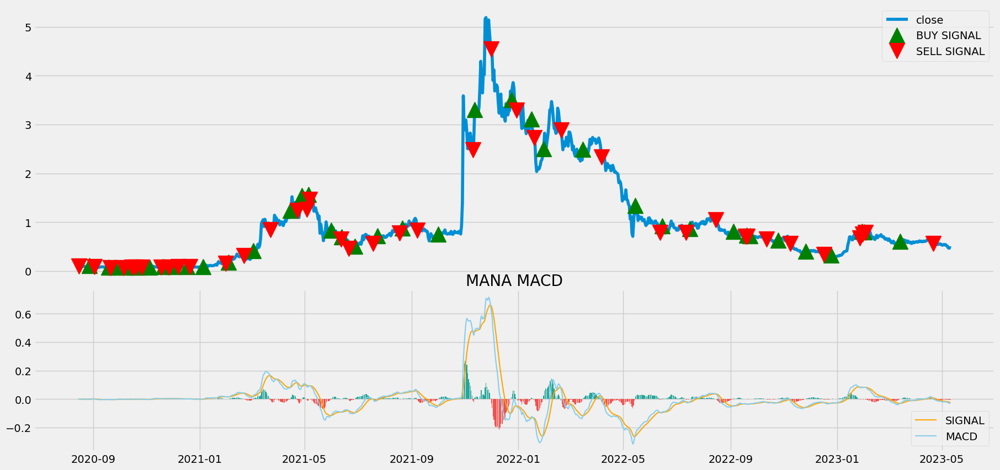

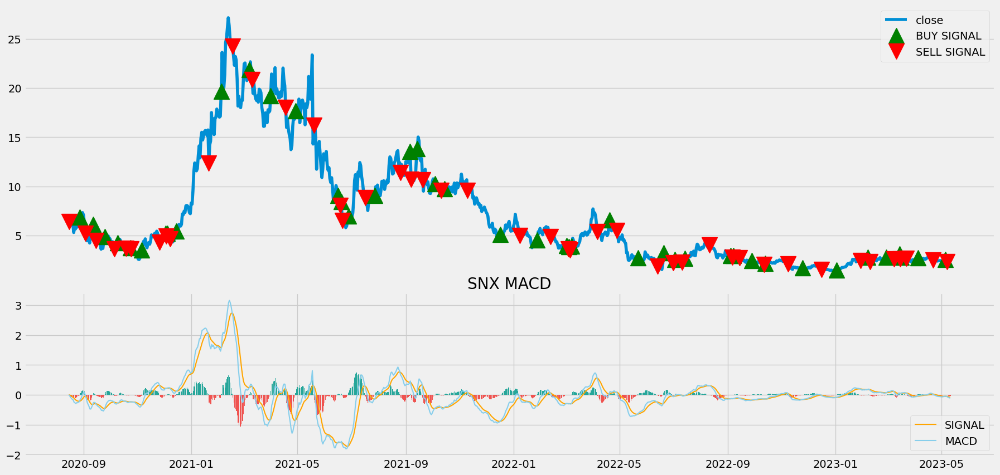

In [33]:
def plot_trading(coin, data, prices, buy_price, sell_price, macd_signal):
    ax1 = plt.subplot2grid((8,1), (0,0), rowspan = 5, colspan = 1)
    #Delete x-axis label for the first graph
    ax1.axes.xaxis.set_visible(False)
    
    ax2 = plt.subplot2grid((8,1), (5,0), rowspan = 3, colspan = 1)

    ax1.plot(prices, label = 'close')
    ax1.plot(prices.index, buy_price, marker = '^', color = 'green', markersize = 20, label = 'BUY SIGNAL', linewidth = 0)
    ax1.plot(prices.index, sell_price, marker = 'v', color = 'r', markersize = 20, label = 'SELL SIGNAL', linewidth = 0)
    ax1.legend()

    
    
    ax2.plot(data['signal'], color = 'orange', linewidth = 1.5, label = 'SIGNAL')
    ax2.plot(data['macd'], color = 'skyblue', linewidth = 1.5, label = 'MACD')
    
    for i in range(len(data)):
        if str(data['hist'][i])[0] == '-':
            ax2.bar(data.index[i], data['hist'][i], color = '#ef5350')
        else:
            ax2.bar(data.index[i], data['hist'][i], color = '#26a69a')
    
    

    plt.legend(loc = 'lower right')
    plt.title(f"{coin} MACD")
    
    
    plt.show()
    
#plot trading for all coins
for i in range(len(all_df)):
    plot_trading(all_df_names[i], all_df[i], all_df[i]['close'], macd_signals[i][0], macd_signals[i][1], macd_signals[i][2])
    

<small>

We can observe that whenever the MACD line crosses above the Signal line, a buy signal is plotted in green color, similarly, whenever the Signal line crosses above the MACD line, a sell signal is plotted in red color. 

</small>

6. Creating the Position

In [34]:
class MACD:
    
    def __init__(self, df, fast_period=12, slow_period=26, signal_period=9):
        self.df = df
        self.fast_period = fast_period
        self.slow_period = slow_period
        self.signal_period = signal_period
        
    def calculate(self):
        exp1 = self.df['close'].ewm(span=self.fast_period, adjust=False).mean()
        exp2 = self.df['close'].ewm(span=self.slow_period, adjust=False).mean()
        macd = exp1 - exp2
        signal = macd.ewm(span=self.signal_period, adjust=False).mean()
        histogram = macd - signal
        return pd.concat([macd, signal, histogram], axis=1, keys=['macd', 'signal', 'histogram'])
    
    def calculate_position(self):
        macd_signal = self.calculate()['histogram']
        position = []
        for i in range(len(macd_signal)):
            if macd_signal[i] > 0:
                position.append(0)
            else:
                position.append(1)

        for i in range(len(self.df['close'])):
            if macd_signal[i] == 0:
                position[i] = 0
            elif macd_signal[i] < 0:
                position[i] = 1
            else:
                position[i] = position[i-1]

        return pd.DataFrame(position, columns=['macd_position'], index=self.df.index)
    
    
    def generate_strategy(self):
        frames = [self.df['close'], self.calculate()['macd'], self.calculate()['signal'], 
                  self.calculate()['histogram'], self.calculate_position()]
        return pd.concat(frames, join='inner', axis=1)

In [35]:
for i in range(len(all_df)):
    all_df[i] = MACD(all_df[i].copy()).generate_strategy()
    
  

    
all_df[3].head() 

,close,macd,signal,histogram,macd_position
date,,,,,
2020-08-15,11852.40,0.000000,0.000000,0.000000,0
2020-08-16,11911.00,4.674644,0.934929,3.739715,0
2020-08-17,12281.13,37.809882,8.309919,29.499962,0
2020-08-18,11945.01,36.526665,13.953268,22.573396,0
2020-08-19,11754.59,19.914838,15.145582,4.769255,0


In [36]:
#Calculate position for all coins
macd_positions = []
for i in range(len(all_df)):
    macd_positions.append(all_df[i]['macd_position'])
    

<small>

The first condition is to check whether the value of the ‘signal’ list is ‘1’ or not. If it is ‘1’, then the value of the ‘position’ list gets appended with ‘1’ which means that we are buying the crypto. Similarly, if the value of the ‘signal’ list is ‘-1’, then the value of the ‘position’ list gets appended with ‘-1’ which means that we are selling the crypto. If the value of the ‘signal’ list is ‘0’, then the value of the ‘position’ list gets appended with ‘0’ which means that we are not doing anything with the crypto.

</small>

8. Backtesting

In [37]:
all_df_names

['ATOM',
 'AVAX',
 'BLZ',
 'BTC',
 'BTG',
 'ETH',
 'GTO',
 'LINK',
 'LSK',
 'LUNA',
 'MANA',
 'SNX']

In [38]:
all_df[4].head()

,close,macd,signal,histogram,macd_position
date,,,,,
2021-04-16,114.784,0.000000,0.000000,0.000000,0
2021-04-17,106.764,-0.639772,-0.127954,-0.511818,1
2021-04-18,93.016,-2.230434,-0.548450,-1.681983,1
2021-04-19,86.875,-3.941141,-1.226988,-2.714152,1
2021-04-20,94.794,-4.604810,-1.902553,-2.702257,1


In [39]:
def macd_strategy(df, coin, investment_value, transaction_fee,
                  time_frame):
    
    # Calculate the returns
    df_ret = pd.DataFrame(np.diff(df['close'])).rename(columns = {0:'returns'})
    macd_strategy_ret = []
    for i in range(len(df_ret)):
        try:
            returns = df_ret.iloc[i]['returns']*df['macd_position'].iloc[i]
            macd_strategy_ret.append(returns)
        except:
            pass
    #Create a new dataframe for the strategy returns and add the strategy returns to the dataframe
    for i in range(len(df_ret)):    
        macd_new_returns = pd.DataFrame(macd_strategy_ret).rename(columns = {0:'macd_returns'}) 
    macd_strategy_ret_df = pd.concat([df_ret, macd_new_returns], axis = 1).dropna().reset_index(drop = True)


    
    # Calculate the investment returns
    number_of_assets = floor(investment_value/df['close'][0])
    macd_investment_ret = []
    for i in range(len(macd_strategy_ret_df)):
        returns = number_of_assets*macd_strategy_ret_df['macd_returns'].iloc[i]
        macd_investment_ret.append(returns)
    macd_investment_ret_df = pd.DataFrame(macd_investment_ret).rename(columns = {0:'investment_returns'})
    macd_investment_ret_df.index = df.index[-len(macd_investment_ret_df):]
    macd_investment_ret_df.index = pd.to_datetime(macd_investment_ret_df.index)

    # Calculate the total investment return
    total_investment_ret = round(sum(macd_investment_ret_df['investment_returns']), 2)
    profit_percentage = round(((total_investment_ret - investment_value)/investment_value)*100, 2)
         

    # Print the results
    print(cl('Time Period:{} to {}'.format(df.index[0], df.index[-1]), attrs = ['bold']))
    print(cl('Profit gained from the MACD strategy by investing ${} in {}: {}'.format(investment_value, coin, total_investment_ret), attrs = ['bold']))
    print(cl('Profit percentage of the MACD strategy : {}%'.format(profit_percentage), attrs = ['bold']))
    print(cl('Profit per month: {}'.format(round(total_investment_ret/len(macd_investment_ret_df['investment_returns'])*30, 2)), attrs = ['bold']))
    print(cl('Number of trades:', attrs = ['bold']), len(macd_investment_ret_df[macd_investment_ret_df['investment_returns'] != 0]))
    print(cl('Profit per trade: {}'.format(round(total_investment_ret/len(macd_investment_ret_df['investment_returns']), 2)), attrs = ['bold']))
    print(cl('_______________________________________________________________________', attrs = ['bold']))
    print('\n')
    # Return the results as a dictionary
    return total_investment_ret, profit_percentage, round(total_investment_ret/len(macd_investment_ret_df['investment_returns'])*30, 2), len(macd_investment_ret_df[macd_investment_ret_df['investment_returns'] != 0]), round(total_investment_ret/len(macd_investment_ret_df['investment_returns']), 2)


# Run the MACD strategy function to see the results
for i in range(len(all_df)):
    macd_strategy(all_df[i], all_df_names[i], 100000, 0.001, '1y')

Time Period:2020-08-15 00:00:00 to 2023-05-11 00:00:00
Profit gained from the MACD strategy by investing $100000 in ATOM: 81205.43
Profit percentage of the MACD strategy : -18.79%
Profit per month: 2438.6
Number of trades: 996
Profit per trade: 81.29
_______________________________________________________________________


Time Period:2020-09-22 00:00:00 to 2023-05-11 00:00:00
Profit gained from the MACD strategy by investing $100000 in AVAX: 222862.14
Profit percentage of the MACD strategy : 122.86%
Profit per month: 6957.19
Number of trades: 958
Profit per trade: 231.91
_______________________________________________________________________


Time Period:2020-08-15 00:00:00 to 2023-05-11 00:00:00
Profit gained from the MACD strategy by investing $100000 in BLZ: -51966.28
Profit percentage of the MACD strategy : -151.97%
Profit per month: -1560.55
Number of trades: 996
Profit per trade: -52.02
_______________________________________________________________________


Time Period:2020-0

In [40]:
#Total profit from all coins
total_profit = 0
try:
    for i in range(len(all_df)):
        total_profit += macd_strategy(all_df[i], all_df_names[i], 1000, 0.001, '1y')[0]
except:
    pass
print('Total profit from all coins: {}'.format(total_profit))
    

Time Period:2020-08-15 00:00:00 to 2023-05-11 00:00:00
Profit gained from the MACD strategy by investing $1000 in ATOM: 809.34
Profit percentage of the MACD strategy : -19.07%
Profit per month: 24.3
Number of trades: 996
Profit per trade: 0.81
_______________________________________________________________________


Time Period:2020-09-22 00:00:00 to 2023-05-11 00:00:00
Profit gained from the MACD strategy by investing $1000 in AVAX: 2216.89
Profit percentage of the MACD strategy : 121.69%
Profit per month: 69.21
Number of trades: 958
Profit per trade: 2.31
_______________________________________________________________________


Time Period:2020-08-15 00:00:00 to 2023-05-11 00:00:00
Profit gained from the MACD strategy by investing $1000 in BLZ: -519.63
Profit percentage of the MACD strategy : -151.96%
Profit per month: -15.6
Number of trades: 996
Profit per trade: -0.52
_______________________________________________________________________


Time Period:2020-08-15 00:00:00 to 2023-0

In [45]:
#make it into a dataframe
macd_strategy_results = []
for i in range(len(all_df)):
    macd_strategy_results.append(macd_strategy(all_df[i], all_df_names[i], 100000, 0.001, '1y'))
macd_strategy_results_df = pd.DataFrame(macd_strategy_results, columns = ['total_profit', 'profit_percentage', 'profit_per_month', 'number_of_trades', 'profit_per_trade'], index = all_df_names)
macd_strategy_results_df
    
    

Time Period:2020-08-15 00:00:00 to 2023-05-11 00:00:00
Profit gained from the MACD strategy by investing $100000 in ATOM: 81205.43
Profit percentage of the MACD strategy : -18.79%
Profit per month: 2438.6
Number of trades: 996
Profit per trade: 81.29
_______________________________________________________________________


Time Period:2020-09-22 00:00:00 to 2023-05-11 00:00:00
Profit gained from the MACD strategy by investing $100000 in AVAX: 222862.14
Profit percentage of the MACD strategy : 122.86%
Profit per month: 6957.19
Number of trades: 958
Profit per trade: 231.91
_______________________________________________________________________


Time Period:2020-08-15 00:00:00 to 2023-05-11 00:00:00
Profit gained from the MACD strategy by investing $100000 in BLZ: -51966.28
Profit percentage of the MACD strategy : -151.97%
Profit per month: -1560.55
Number of trades: 996
Profit per trade: -52.02
_______________________________________________________________________


Time Period:2020-0

,total_profit,profit_percentage,profit_per_month,number_of_trades,profit_per_trade
ATOM,81205.43,-18.79,2438.60,996,81.29
AVAX,222862.14,122.86,6957.19,958,231.91
BLZ,-51966.28,-151.97,-1560.55,996,-52.02
BTC,125125.68,25.13,3757.53,994,125.25
BTG,-77618.29,-177.62,-4188.04,551,-139.60
ETH,324016.77,224.02,9730.23,997,324.34
GTO,69111.96,-30.89,2075.43,985,69.18
LINK,-63778.52,-163.78,-1915.27,993,-63.84
LSK,-41674.47,-141.67,-1251.49,992,-41.72
LUNA,124802.74,24.80,3836.15,964,127.87


9. SPY ETF Comparison


In [43]:
#The SPDR S&P 500 ETF Trust offers investors an efficient way to diversify
#their exposure to the U.S. equity market without having to invest in multiple stocks. 

import yfinance as yf

def get_benchmark(start_date, investment_value, transaction_fee):
    # Get the data
    benchmark_df = pd.DataFrame(yf.download('SPY', start = start_date))
    benchmark_df = benchmark_df[['Close']]
    benchmark_df.columns = ['close']
    benchmark_df['returns'] = benchmark_df['close'].pct_change()
    benchmark_df['benchmark_returns'] = benchmark_df['returns']*investment_value
    benchmark_df.index = pd.to_datetime(benchmark_df.index)
    benchmark_df['benchmark_returns'].iloc[0] = 0
    benchmark_df['benchmark_investment_returns'] = investment_value + benchmark_df['benchmark_returns'].cumsum()
    benchmark_df['benchmark_investment_returns'] = benchmark_df['benchmark_investment_returns'] - transaction_fee
    benchmark_df['benchmark_investment_returns'] = benchmark_df['benchmark_investment_returns'].round(2)
    benchmark_df['benchmark_returns'] = benchmark_df['benchmark_returns'].round(2)
    benchmark_df = benchmark_df.dropna().reset_index(drop = True)
    return benchmark_df

# Run the function to get the benchmark dataframe
benchmark_df = get_benchmark('2020-01-01', 100000, 0.001)


[*********************100%***********************]  1 of 1 completed


In [44]:
#Compare the results of the MACD strategy with the benchmark
def compare_results(df, coin):
    # Get the MACD strategy results
    macd_results = macd_strategy(df, coin, 100000, 0.001, '1y')
    # Get the benchmark results
    benchmark_results = benchmark_df['benchmark_investment_returns'].iloc[-1]
    # Get the difference between the MACD strategy and the benchmark
    difference = macd_results[0] - benchmark_results
    # Print the results
    print(cl('Outperformance of the MACD strategy vs the benchmark SPY:', attrs = ['bold']))
    print(cl('Outperformance in dollars: {}'.format(round(difference, 2)), attrs = ['bold']))
    print(cl('Outperformance in percentage: {}%'.format(round((difference/benchmark_results)*100, 2)), attrs = ['bold']))
    print('\n')
    # Return the results
    return difference, round((difference/benchmark_results)*100, 2)


# Run the function to compare the results
for i in range(len(all_df)):
    compare_results(all_df[i], all_df_names[i])

#Total outperformance of all coins
total_outperformance = 0
try:
    for i in range(len(all_df)):
        total_outperformance += compare_results(all_df[i], all_df_names[i])[0]
except:
    pass

print('Total outperformance of all coins: {}'.format(total_outperformance))

#make it into a dataframe
compare_results_list = []
for i in range(len(all_df)):
    compare_results_list.append(compare_results(all_df[i], all_df_names[i]))
compare_results_df = pd.DataFrame(compare_results_list, columns = ['outperformance_dollars', 'outperformance_percentage'], index = all_df_names)
compare_results_df


Time Period:2020-08-15 00:00:00 to 2023-05-11 00:00:00
Profit gained from the MACD strategy by investing $100000 in ATOM: 81205.43
Profit percentage of the MACD strategy : -18.79%
Profit per month: 2438.6
Number of trades: 996
Profit per trade: 81.29
_______________________________________________________________________


Outperformance of the MACD strategy vs the benchmark SPY:
Outperformance in dollars: -52007.65
Outperformance in percentage: -39.04%


Time Period:2020-09-22 00:00:00 to 2023-05-11 00:00:00
Profit gained from the MACD strategy by investing $100000 in AVAX: 222862.14
Profit percentage of the MACD strategy : 122.86%
Profit per month: 6957.19
Number of trades: 958
Profit per trade: 231.91
_______________________________________________________________________


Outperformance of the MACD strategy vs the benchmark SPY:
Outperformance in dollars: 89649.06
Outperformance in percentage: 67.3%


Time Period:2020-08-15 00:00:00 to 2023-05-11 00:00:00
Profit gained from the MA

,outperformance_dollars,outperformance_percentage
ATOM,-52007.65,-39.04
AVAX,89649.06,67.30
BLZ,-185179.36,-139.01
BTC,-8087.40,-6.07
BTG,-210831.37,-158.27
ETH,190803.69,143.23
GTO,-64101.12,-48.12
LINK,-196991.60,-147.88
LSK,-174887.55,-131.28
LUNA,-8410.34,-6.31


In [48]:
#Create a table to compare the results of the MACD strategy with the benchmark
def compare_results_table():
    # Create a table to compare the results of the MACD strategy with the benchmark
    compare_results_table = PrettyTable(['Coin', 'Total profit', 'Profit percentage', 'Profit per month', 'Number of trades', 'Profit per trade', 'Outperformance in dollars', 'Outperformance in percentage'])
    for i in range(len(all_df)):
        compare_results_table.add_row([all_df_names[i],
                                       '${}'.format(macd_strategy_results_df['total_profit'].iloc[i]),
                                       '{}%'.format(macd_strategy_results_df['profit_percentage'].iloc[i]),
                                       '${}'.format(macd_strategy_results_df['profit_per_month'].iloc[i]),
                                       macd_strategy_results_df['number_of_trades'].iloc[i],
                                       '${}'.format(macd_strategy_results_df['profit_per_trade'].iloc[i]),
                                       '${}'.format(round(compare_results_df['outperformance_dollars'].iloc[i], 2)),
                                       '{}%'.format(compare_results_df['outperformance_percentage'].iloc[i])])
    print(compare_results_table)

In [49]:
compare_results_table()

+------+--------------+-------------------+------------------+------------------+------------------+---------------------------+------------------------------+
| Coin | Total profit | Profit percentage | Profit per month | Number of trades | Profit per trade | Outperformance in dollars | Outperformance in percentage |
+------+--------------+-------------------+------------------+------------------+------------------+---------------------------+------------------------------+
| ATOM |  $81205.43   |      -18.79%      |     $2438.6      |       996        |      $81.29      |         $-52007.65        |           -39.04%            |
| AVAX |  $222862.14  |      122.86%      |     $6957.19     |       958        |     $231.91      |         $89649.06         |            67.3%             |
| BLZ  |  $-51966.28  |      -151.97%     |    $-1560.55     |       996        |     $-52.02      |        $-185179.36        |           -139.01%           |
| BTC  |  $125125.68  |       25.13%    